## **Часть 1. Бинарная классификация**

### **Шаг 1. Загрузка данных**

In [ ]:
import pandas as pd
from ucimlrepo import fetch_ucirepo

# Загрузка датасета Predictive Maintenance (ID: 601)
dataset = fetch_ucirepo(id=601)

# Объединение признаков и целевых переменных в один DataFrame
data = pd.concat([dataset.data.features, dataset.data.targets], axis=1)

# Просмотр названий всех колонок
print("Колонки в датасете:", data.columns.tolist())

In [1]:
import pandas as pd

# Загрузка датасета из родительской директории
data = pd.read_csv("../data/predictive_maintenance.csv")

# Просмотр названий всех колонок
print("Колонки в датасете:", data.columns.tolist())

Колонки в датасете: ['UDI', 'Product ID', 'Type', 'Air temperature [K]', 'Process temperature [K]', 'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]', 'Machine failure', 'TWF', 'HDF', 'PWF', 'OSF', 'RNF']


In [2]:
# Вывод первых 5 строк исходного датасета
data.head()

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,0,0,0,0,0
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,0,0,0,0,0


### **Шаг 2. Визуализация признаков и связей**

#### **Шаг 2.1 Визуализация распределений и связей**

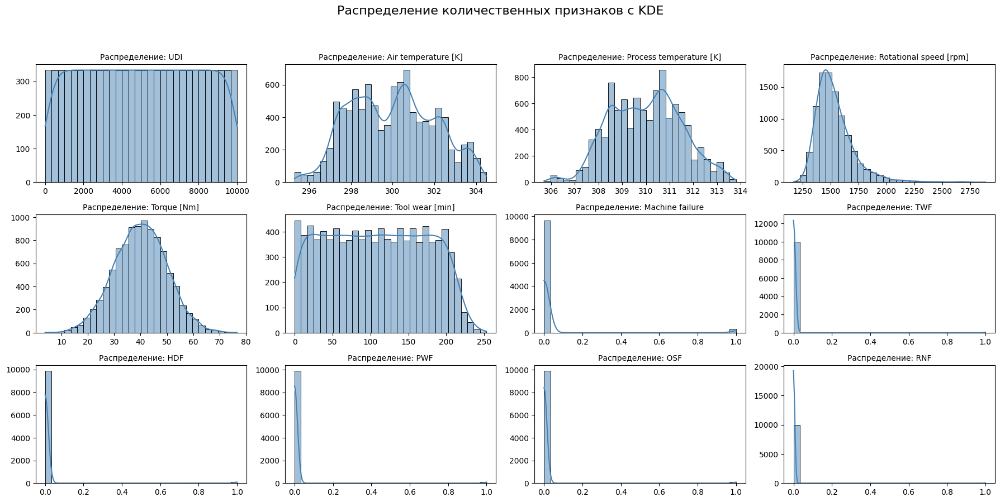

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt

# Отрисовка гистограмм с кривой плотности KDE для всех числовых признаков
numeric_features = data.select_dtypes(include='number').columns

plt.figure(figsize=(18, 12))

# Построение отдельных графиков для каждого признака
for i, feature in enumerate(numeric_features, 1):
    plt.subplot(4, 4, i)
    sns.histplot(data[feature], kde=True, bins=30, color='steelblue')
    plt.title(f"Распределение: {feature}", fontsize=10)
    plt.xlabel("")
    plt.ylabel("")

plt.suptitle("Распределение количественных признаков с KDE", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

#### **Шаг 2.2 Корреляционная матрица признаков**

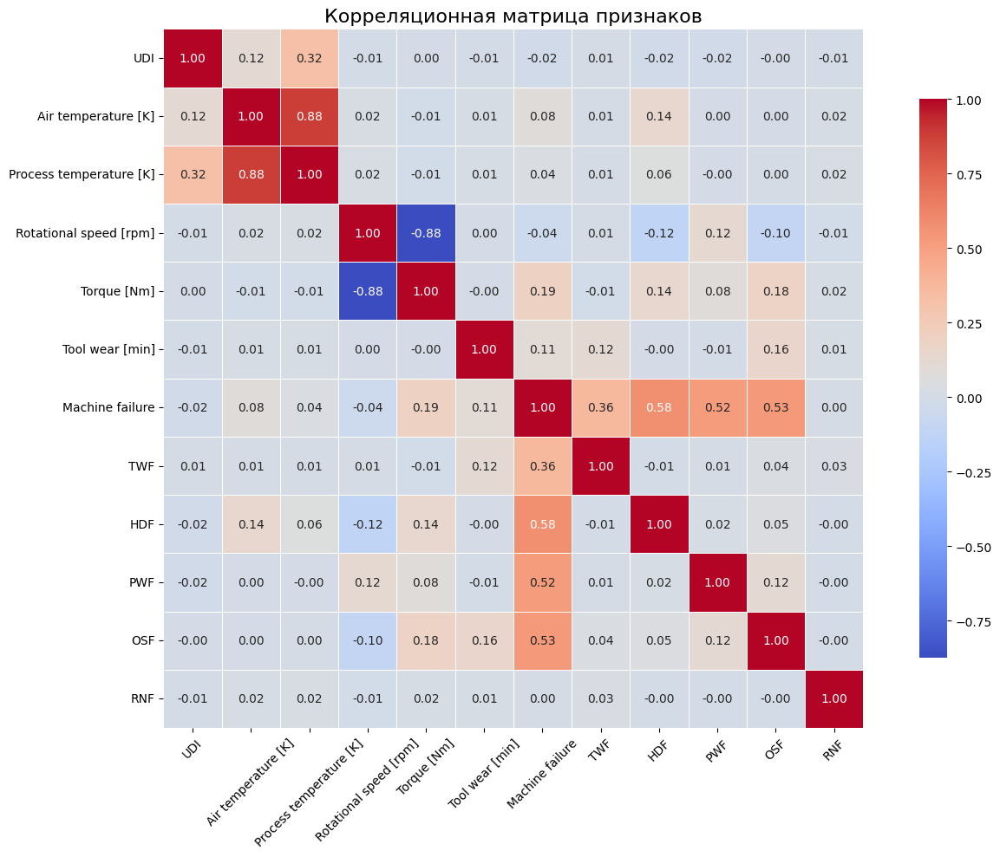

In [4]:
# Импорт необходимых библиотек
import numpy as np

# Вычисление корреляционной матрицы по числовым признакам
corr_matrix = data.select_dtypes(include='number').corr()

# Построение тепловой карты с аннотациями
plt.figure(figsize=(14, 10))
sns.heatmap(
    corr_matrix, 
    annot=True,               # Отображение числовых значений
    fmt=".2f",                # Формат отображения чисел
    cmap="coolwarm",          # Цветовая схема
    square=True,              # Квадратные ячейки
    linewidths=0.5,           # Линии между ячейками
    cbar_kws={"shrink": .8}   # Параметры цветовой шкалы
)
plt.title("Корреляционная матрица признаков", fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

#### **Шаг 2.3 Парный анализ взаимосвязей признаков**

In [7]:
# Список количественных признаков
feature_cols = [
    'Air temperature [K]',
    'Process temperature [K]',
    'Rotational speed [rpm]',
    'Torque [Nm]',
    'Tool wear [min]'
]

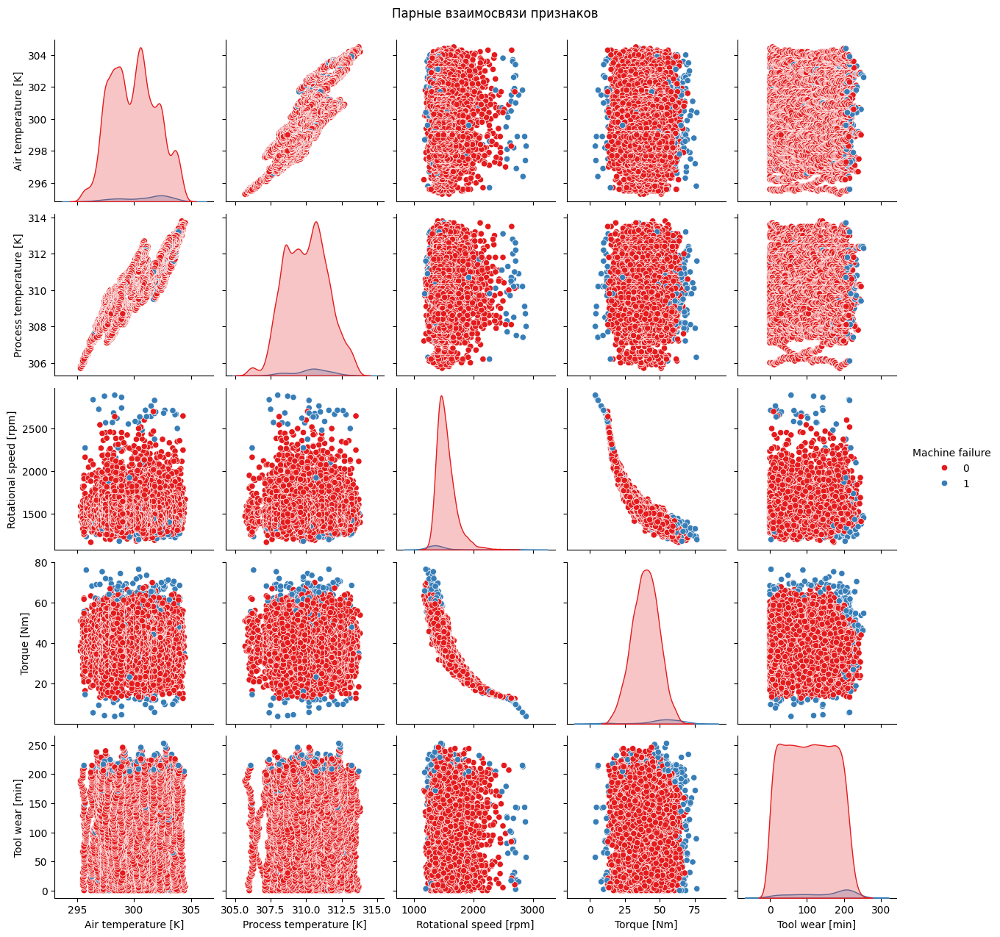

In [8]:
# Построение pairplot для всех признаков
sns.pairplot(data[feature_cols + ['Machine failure']], hue='Machine failure', palette='Set1')
plt.suptitle("Парные взаимосвязи признаков", y=1.02)
plt.show()

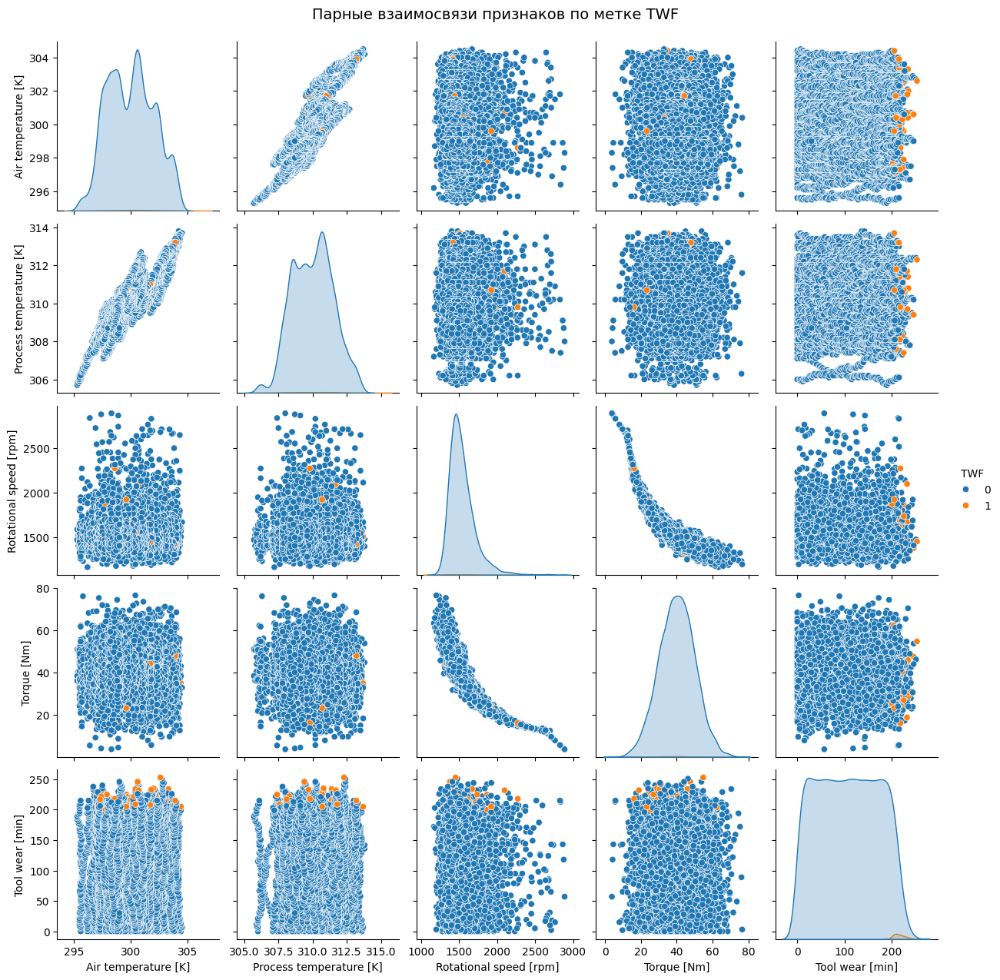

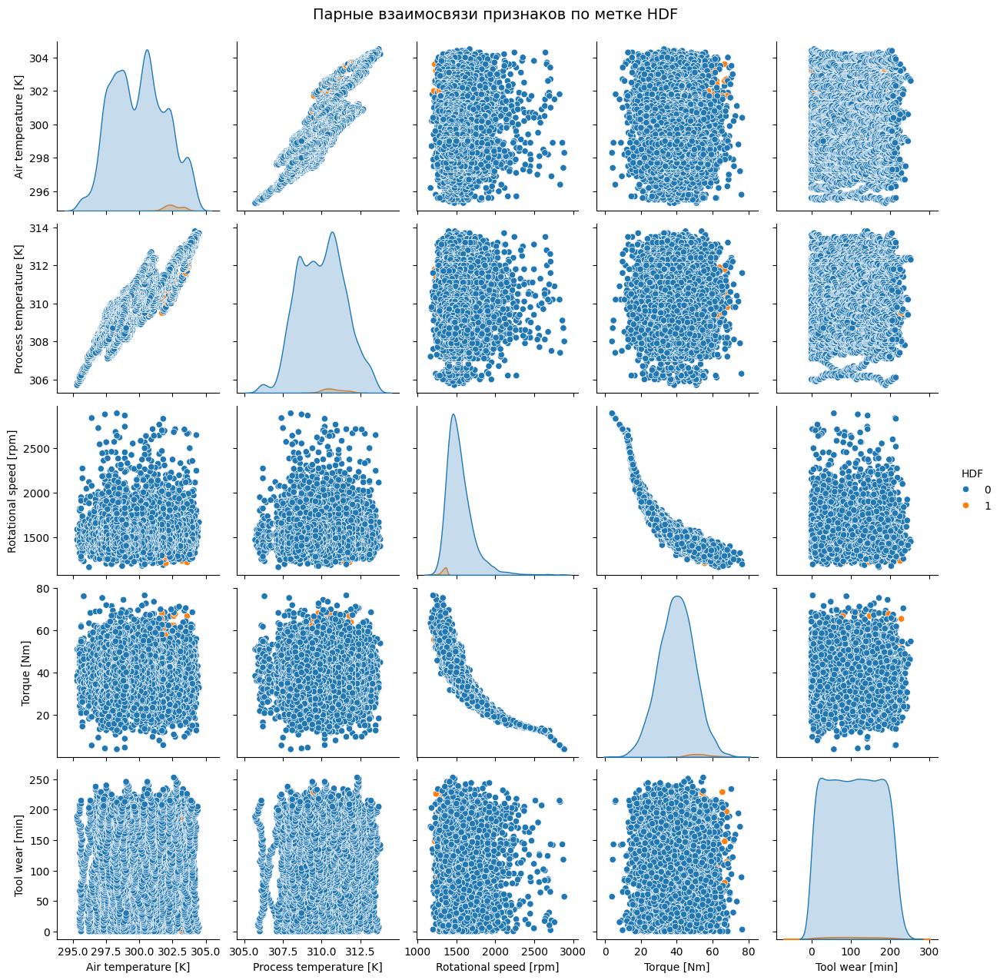

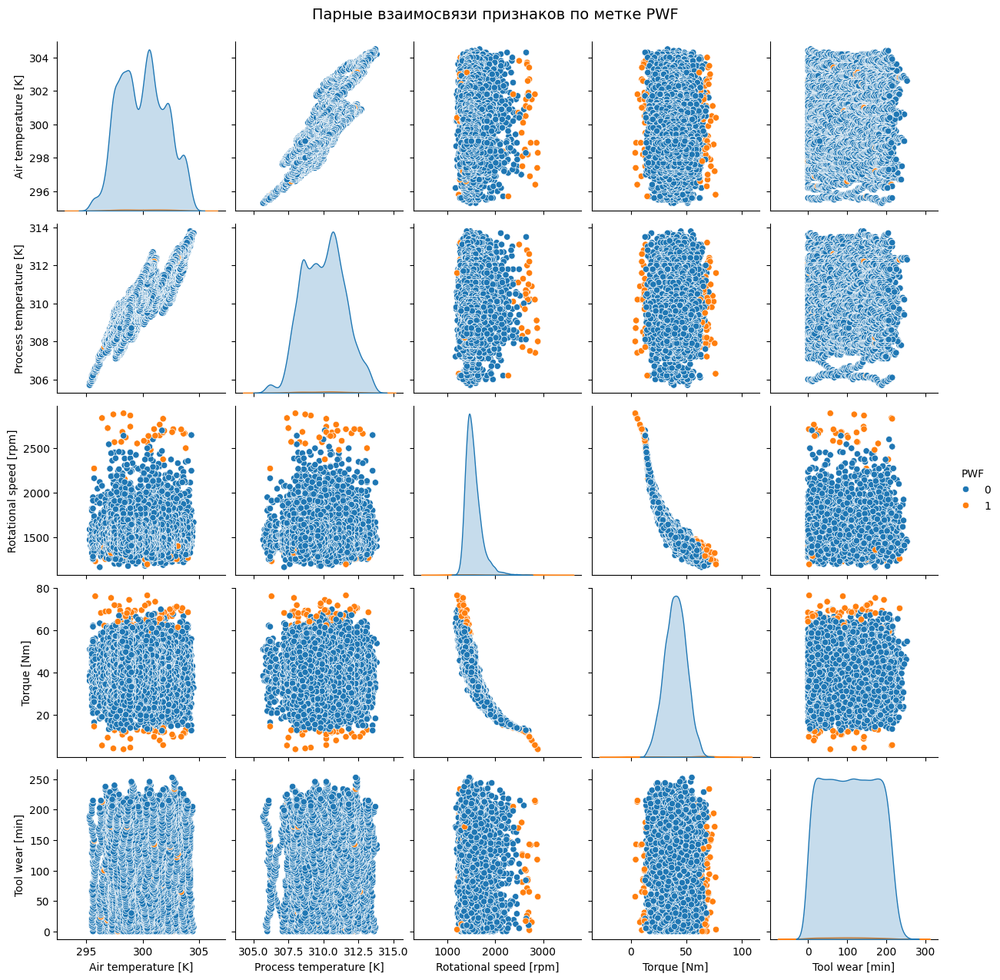

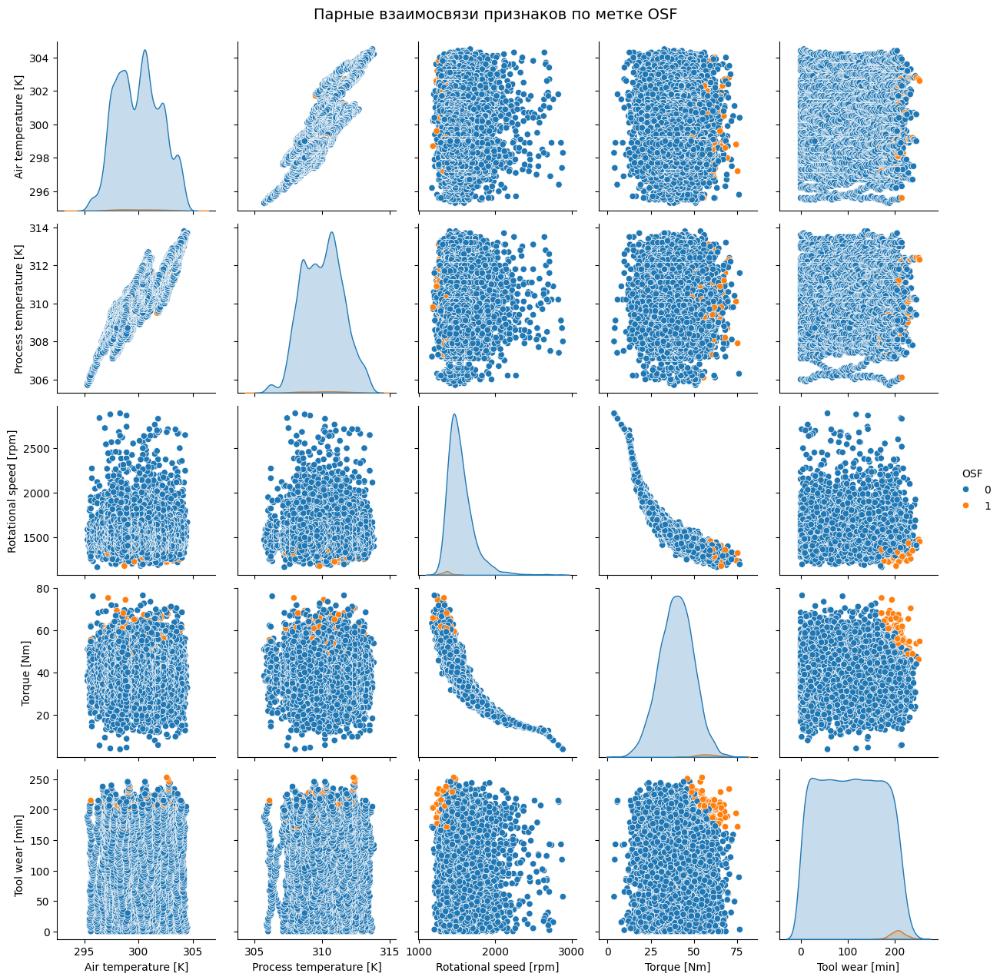

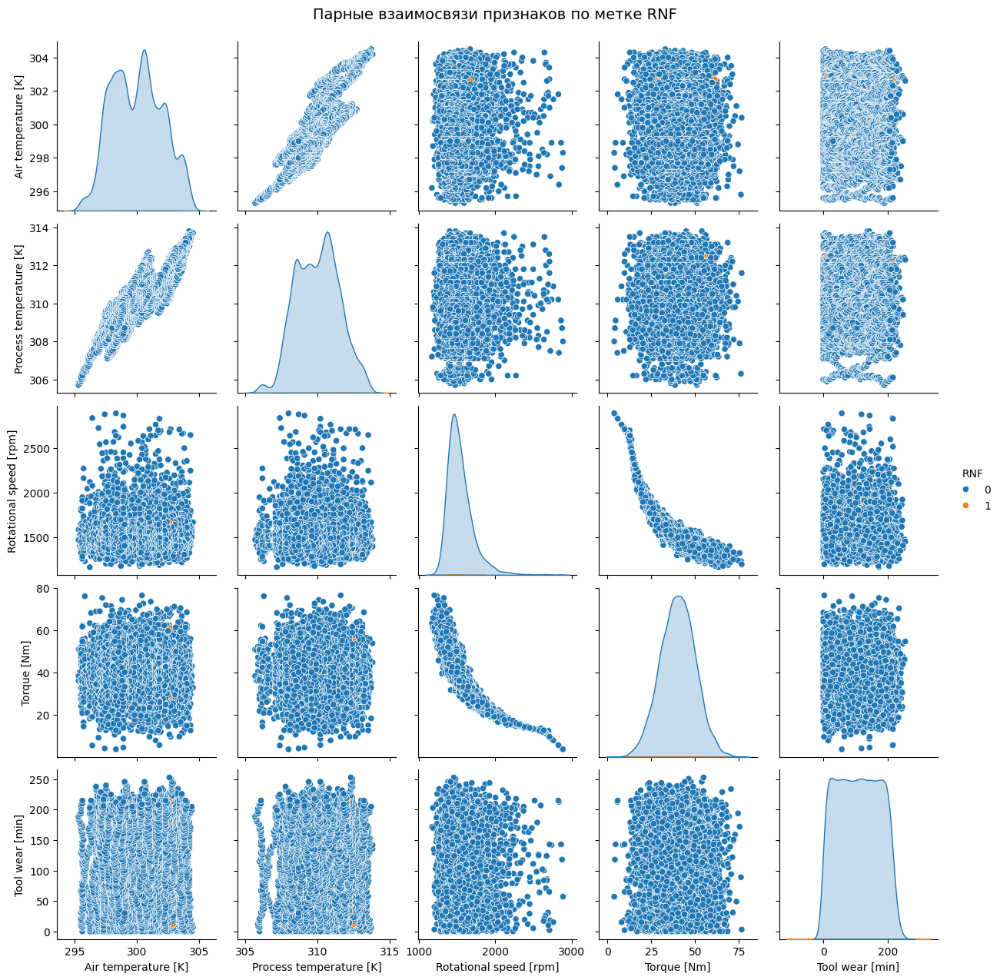

In [9]:
# Список меток мультиклассовых отказов
failure_labels = ['TWF', 'HDF', 'PWF', 'OSF', 'RNF']

# Генерация pairplot по каждой метке отказа
for label in failure_labels:
    sns.pairplot(data[feature_cols + [label]], hue=label, palette='tab10', diag_kind='kde')
    plt.suptitle(f"Парные взаимосвязи признаков по метке {label}", y=1.02, fontsize=14)
    plt.show()

### **Шаг 3. Предобработка данных**

#### **Шаг 3.1 Базовая предобработка данных**

In [12]:
print(data.columns.tolist())

['Type', 'Air temperature [K]', 'Process temperature [K]', 'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]', 'Machine failure', 'TWF', 'HDF', 'PWF', 'OSF', 'RNF']


In [14]:
# Удаление лишних пробелов в названиях
data.columns = data.columns.str.strip()

# Удаление ненужных столбцов
# data = data.drop(columns=['UDI', 'Product ID'])

# Преобразование категориального признака в числовой
from sklearn.preprocessing import LabelEncoder
data['Type'] = LabelEncoder().fit_transform(data['Type'])

In [15]:
# Проверка на пропущенные значения
print("\nПроверка на пропуски:")
print(data.isnull().sum())


Проверка на пропуски:
Type                       0
Air temperature [K]        0
Process temperature [K]    0
Rotational speed [rpm]     0
Torque [Nm]                0
Tool wear [min]            0
Machine failure            0
TWF                        0
HDF                        0
PWF                        0
OSF                        0
RNF                        0
dtype: int64


In [16]:
from sklearn.preprocessing import StandardScaler

# Удаление дубликатов и пропусков
data_cleaned = data.drop_duplicates().dropna()

# Определение числовых признаков
numerical_features = [
    'Air temperature [K]',
    'Process temperature [K]',
    'Rotational speed [rpm]',
    'Torque [Nm]',
    'Tool wear [min]'
]

# Масштабирование числовых признаков
scaler = StandardScaler()
X_scaled = scaler.fit_transform(data_cleaned[numerical_features])
X_scaled_df = pd.DataFrame(X_scaled, columns=numerical_features)

# Добавление меток
for label in ['Machine failure', 'TWF', 'HDF', 'PWF', 'OSF', 'RNF']:
    X_scaled_df[label] = data_cleaned[label].values

# Просмотр результата
X_scaled_df.head()

,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,-0.952389,-0.947360,0.068185,0.282200,-1.695984,0,0,0,0,0,0
1,-0.902393,-0.879959,-0.729472,0.633308,-1.648852,0,0,0,0,0,0
2,-0.952389,-1.014761,-0.227450,0.944290,-1.617430,0,0,0,0,0,0
3,-0.902393,-0.947360,-0.590021,-0.048845,-1.586009,0,0,0,0,0,0
4,-0.902393,-0.879959,-0.729472,0.001313,-1.554588,0,0,0,0,0,0


#### **Шаг 3.2 Продвинутые методы предобработки (обработка выбросов)**

**Выброс (outlier)** – это значение, которое существенно отличается от остальных наблюдений.

Такие значения могут:

* искажать распределения;
* ухудшать обучение модели;
* влиять на метрики (особенно для логистической регрессии и SVM).

**Анализ выбросов по boxplot-графикам**

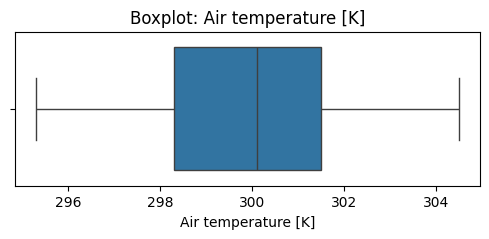

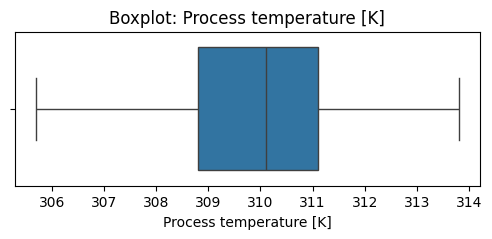

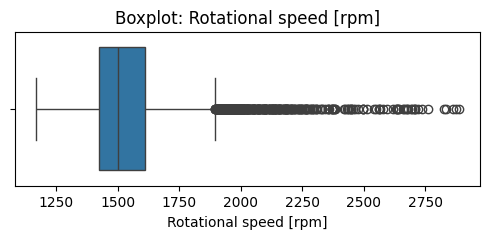

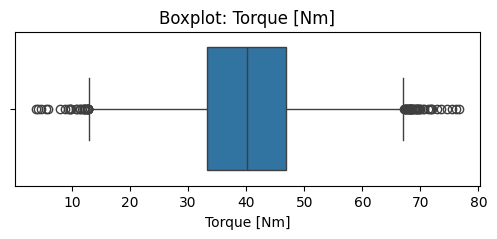

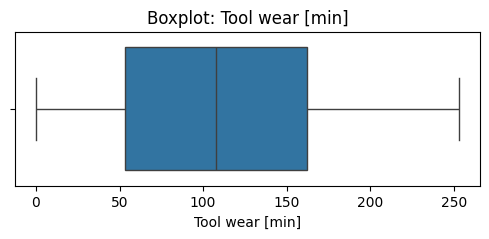

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt

# Построение boxplot-графиков для анализа выбросов
for col in numerical_features:
    plt.figure(figsize=(6, 2))
    sns.boxplot(x=data_cleaned[col])
    plt.title(f"Boxplot: {col}")
    plt.show()

**1. Air temperature**

Распределение: симметричное, без выбросов.

Вывод: выбросов нет. Ничего удалять не нужно.

**2. Process temperature**

Распределение: также нормальное, компактное, без выбросов.

Вывод: выбросов нет. Ничего удалять не нужно.

**3. Rotational speed**

Распределение: большое количество выбросов справа (значения выше +2 std).

Тип выбросов: высокочастотные вращения, возможно, при сбоях.

**4. Torque**

Распределение: выбросы с обеих сторон, но умеренные.

**5. Tool wear**

Распределение: симметричное, без выбросов.

Вывод: выбросов нет. Ничего не делать.

**Шаг 3.3 Удаление выбросов по Z-оценке (только `Rotational speed`, `Torque`) и повторная нормализация**

In [18]:
from scipy.stats import zscore
import numpy as np

# Z-оценки только для проблемных признаков
z_cols = ['Rotational speed [rpm]', 'Torque [Nm]']
z_scores = zscore(data_cleaned[z_cols])

# Фильтрация по Z-оценке
mask = (np.abs(z_scores) < 3).all(axis=1)
data_cleaned_no_outliers = data_cleaned[mask]

print(f"До очистки: {data_cleaned.shape}")
print(f"После удаления выбросов: {data_cleaned_no_outliers.shape}")

До очистки: (10000, 12)
После удаления выбросов: (9822, 12)


In [19]:
# Повторное масштабирование очищенных данных
X_scaled_cleaned = scaler.fit_transform(data_cleaned_no_outliers[numerical_features])
X_scaled_df_cleaned = pd.DataFrame(X_scaled_cleaned, columns=numerical_features)

# Добавление меток
for label in ['Machine failure', 'TWF', 'HDF', 'PWF', 'OSF', 'RNF']:
    X_scaled_df_cleaned[label] = data_cleaned_no_outliers[label].values

# Просмотр первых строк
X_scaled_df_cleaned.head()

,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,-0.951564,-0.946499,0.168123,0.259232,-1.696371,0,0,0,0,0,0
1,-0.901512,-0.879030,-0.802189,0.629670,-1.649212,0,0,0,0,0,0
2,-0.951564,-1.013969,-0.191503,0.957773,-1.617772,0,0,0,0,0,0
3,-0.901512,-0.946499,-0.632554,-0.090039,-1.586332,0,0,0,0,0,0
4,-0.901512,-0.879030,-0.802189,-0.037119,-1.554892,0,0,0,0,0,0


#### **Шаг 3.4 Формирование мультиклассовой метки отказа**

In [20]:
# Шаг 3.4 Формирование мультиклассовой метки отказа
def convert_to_multiclass(df):
    class_labels = ['TWF', 'HDF', 'PWF', 'OSF', 'RNF']
    return df[class_labels].idxmax(axis=1).where(df[class_labels].sum(axis=1) > 0, other='No Failure')

# Преобразование меток ДО удаления выбросов
y_multiclass_full = convert_to_multiclass(X_scaled_df)
X_scaled_df['Failure Type'] = y_multiclass_full

# Преобразование меток ПОСЛЕ удаления выбросов
y_multiclass_clean = convert_to_multiclass(X_scaled_df_cleaned)
X_scaled_df_cleaned['Failure Type'] = y_multiclass_clean

# Проверка распределения Failure Type
print("Распределение Failure Type (до очистки):")
print(X_scaled_df['Failure Type'].value_counts())

print("\nРаспределение Failure Type (после очистки):")
print(X_scaled_df_cleaned['Failure Type'].value_counts())

Распределение Failure Type (до очистки):
Failure Type
No Failure    9652
HDF            115
PWF             91
OSF             78
TWF             46
RNF             18
Name: count, dtype: int64

Распределение Failure Type (после очистки):
Failure Type
No Failure    9520
HDF            115
OSF             78
PWF             47
TWF             44
RNF             18
Name: count, dtype: int64


In [21]:
from sklearn.preprocessing import LabelEncoder

# Инициализация кодировщика
le = LabelEncoder()

# Кодирование Failure Type (до очистки)
X_scaled_df['Failure Type Encoded'] = le.fit_transform(X_scaled_df['Failure Type'])

# Кодирование Failure Type (после очистки)
X_scaled_df_cleaned['Failure Type Encoded'] = le.transform(X_scaled_df_cleaned['Failure Type'])

# Сохраняем маппинг классов
print("Классы Failure Type:", list(le.classes_))

Классы Failure Type: ['HDF', 'No Failure', 'OSF', 'PWF', 'RNF', 'TWF']


In [69]:
y_encoded = le.fit_transform(X_scaled_df["Failure Type"])

# Получение отображения: индекс → метка
for index, label in enumerate(le.classes_):
    print(f"{index}: {label}")

0: HDF
1: No Failure
2: OSF
3: PWF
4: RNF
5: TWF


### **Шаг 4. Разделение данных на обучающую и тестовую выборки**

In [22]:
from sklearn.model_selection import train_test_split

# Деление ДО удаления выбросов
X_full = X_scaled_df[numerical_features]
y_binary_full = X_scaled_df['Machine failure']
y_multi_full = X_scaled_df['Failure Type Encoded']

X_train_bin_full, X_test_bin_full, y_train_bin_full, y_test_bin_full = train_test_split(
    X_full, y_binary_full, test_size=0.2, random_state=42, stratify=y_binary_full
)

X_train_multi_full, X_test_multi_full, y_train_multi_full, y_test_multi_full = train_test_split(
    X_full, y_multi_full, test_size=0.2, random_state=42, stratify=y_multi_full
)

In [23]:
# Деление ПОСЛЕ удаления выбросов
X_clean = X_scaled_df_cleaned[numerical_features]
y_binary_clean = X_scaled_df_cleaned['Machine failure']
y_multi_clean = X_scaled_df_cleaned['Failure Type Encoded']

X_train_bin_clean, X_test_bin_clean, y_train_bin_clean, y_test_bin_clean = train_test_split(
    X_clean, y_binary_clean, test_size=0.2, random_state=42, stratify=y_binary_clean
)

X_train_multi_clean, X_test_multi_clean, y_train_multi_clean, y_test_multi_clean = train_test_split(
    X_clean, y_multi_clean, test_size=0.2, random_state=42, stratify=y_multi_clean
)

In [24]:
print("Бинарная классификация:")
print(f"До очистки: X_train: {X_train_bin_full.shape}, y_train: {y_train_bin_full.shape}")
print(f"После очистки: X_train: {X_train_bin_clean.shape}, y_train: {y_train_bin_clean.shape}")

print("\nМультиклассовая классификация:")
print(f"До очистки: X_train: {X_train_multi_full.shape}, y_train: {y_train_multi_full.shape}")
print(f"После очистки: X_train: {X_train_multi_clean.shape}, y_train: {y_train_multi_clean.shape}")

Бинарная классификация:
До очистки: X_train: (8000, 5), y_train: (8000,)
После очистки: X_train: (7857, 5), y_train: (7857,)

Мультиклассовая классификация:
До очистки: X_train: (8000, 5), y_train: (8000,)
После очистки: X_train: (7857, 5), y_train: (7857,)


### **Шаг 5. Обучение моделей**

Переименование признаков только для обучения моделей (без изменения оригинального data)

In [31]:
import os
import joblib
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier

# Создание директорий
os.makedirs("saved_models/binary", exist_ok=True)
os.makedirs("saved_models/multiclass", exist_ok=True)

# Универсальный словарь моделей
def get_models():
    return {
        "log_reg": LogisticRegression(),
        "rf": RandomForestClassifier(n_estimators=100, random_state=42),
        "svm": SVC(kernel='linear', probability=True, random_state=42),
        "xgb": XGBClassifier(n_estimators=100, learning_rate=0.1, random_state=42, use_label_encoder=False, eval_metric='logloss'),
        "cat": CatBoostClassifier(verbose=0, random_seed=42),
        "lgb": LGBMClassifier(random_state=42)
    }

In [32]:
# Переименование признаков: удаление скобок и единиц измерения
def clean_feature_names(df):
    return df.rename(columns=lambda x: x.replace('[', '').replace(']', '').replace('<', '').replace('>', '').replace(' ', '_').replace('°C', '').replace('/', '_'))

# Применение только к X-матрицам (не к y!)
X_train_bin_full = clean_feature_names(X_train_bin_full)
X_train_bin_clean = clean_feature_names(X_train_bin_clean)
X_train_multi_full = clean_feature_names(X_train_multi_full)
X_train_multi_clean = clean_feature_names(X_train_multi_clean)

X_test_bin_full = clean_feature_names(X_test_bin_full)
X_test_bin_clean = clean_feature_names(X_test_bin_clean)
X_test_multi_full = clean_feature_names(X_test_multi_full)
X_test_multi_clean = clean_feature_names(X_test_multi_clean)

In [33]:
for name, model in get_models().items():
    # Обучение на данных до очистки
    model.fit(X_train_bin_full, y_train_bin_full)
    joblib.dump(model, f"saved_models/binary/{name}_full.pkl")

    # Обучение на очищенных данных
    model.fit(X_train_bin_clean, y_train_bin_clean)
    joblib.dump(model, f"saved_models/binary/{name}_clean.pkl")

print("Бинарная классификация: все модели обучены и сохранены.")

c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\xgboost\training.py:183: UserWarning: [14:18:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\xgboost\training.py:183: UserWarning: [14:18:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[LightGBM] [Info] Number of positive: 271, number of negative: 7729
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000379 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 924
[LightGBM] [Info] Number of data points in the train set: 8000, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.033875 -> initscore=-3.350616
[LightGBM] [Info] Start training from score -3.350616
[LightGBM] [Info] Number of positive: 234, number of negative: 7623
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000138 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 920
[LightGBM] [Info] Number of data points in the train set: 7857, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.029782 -> initscore=-3.483604
[LightGBM] [In

In [34]:
for name, model in get_models().items():
    # Обучение на данных до очистки
    model.fit(X_train_multi_full, y_train_multi_full)
    joblib.dump(model, f"saved_models/multiclass/{name}_full.pkl")

    # Обучение на очищенных данных
    model.fit(X_train_multi_clean, y_train_multi_clean)
    joblib.dump(model, f"saved_models/multiclass/{name}_clean.pkl")

print("Мультиклассовая классификация: все модели обучены и сохранены.")

c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\xgboost\training.py:183: UserWarning: [14:18:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\xgboost\training.py:183: UserWarning: [14:18:41] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000180 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 922
[LightGBM] [Info] Number of data points in the train set: 8000, number of used features: 5
[LightGBM] [Info] Start training from score -4.465408
[LightGBM] [Info] Start training from score -0.035368
[LightGBM] [Info] Start training from score -4.860062
[LightGBM] [Info] Start training from score -4.696737
[LightGBM] [Info] Start training from score -6.348139
[LightGBM] [Info] Start training from score -5.376279
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

### **Шаг 6. Оценка моделей**

#### **Шаг 6.1 Универсальная функция для оценки и визуализации**

In [35]:
from sklearn.metrics import (
    accuracy_score, confusion_matrix, classification_report,
    roc_auc_score, roc_curve, f1_score
)
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Универсальная функция: оценка модели + сбор метрик
def evaluate_and_collect(model, X_test, y_test, model_name="Model", multiclass=False):
    print(f"\nОценка модели: {model_name}")

    y_pred = model.predict(X_test)

    # Для бинарной задачи: используем вероятности для ROC
    if not multiclass:
        y_proba = model.predict_proba(X_test)[:, 1]
        auc = roc_auc_score(y_test, y_proba)
        fpr, tpr, _ = roc_curve(y_test, y_proba)
    else:
        y_proba = model.predict_proba(X_test)
        auc = roc_auc_score(pd.get_dummies(y_test), y_proba, multi_class="ovr")
        fpr = tpr = None

    acc = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average='macro')

    print(f"Accuracy: {acc:.4f}")
    print("Confusion Matrix:")
    cm = confusion_matrix(y_test, y_pred)
    print(cm)

    plt.figure(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f"Confusion Matrix: {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.tight_layout()
    plt.show()

    print("Classification Report:")
    print(classification_report(y_test, y_pred))
    print(f"ROC-AUC: {auc:.4f}")

    return {
        "model": model_name,
        "accuracy": acc,
        "f1": f1,
        "auc": auc,
        "fpr": fpr,
        "tpr": tpr
    }

#### **Шаг 6.2  Загрузка всех моделей**

In [36]:
import os
import joblib

def load_all_models(base_path):
    all_models = {
        "binary": {"до очистки": {}, "после очистки": {}},
        "multiclass": {"до очистки": {}, "после очистки": {}}
    }

    for task_type in ["binary", "multiclass"]:
        folder = os.path.join(base_path, task_type)
        for file in os.listdir(folder):
            if file.endswith(".pkl"):
                model_path = os.path.join(folder, file)
                model = joblib.load(model_path)
                name = file.replace(".pkl", "")
                if "_full" in file:
                    key = name.replace("_full", "").replace("_", " ").title() + " (до очистки)"
                    all_models[task_type]["до очистки"][key] = model
                elif "_clean" in file:
                    key = name.replace("_clean", "").replace("_", " ").title() + " (после очистки)"
                    all_models[task_type]["после очистки"][key] = model
    return all_models

all_models = load_all_models("saved_models")

#### **Шаг 6.3 Автоматическая оценка**


Оценка модели: Cat (до очистки)
Accuracy: 0.9850
Confusion Matrix:
[[1925    7]
 [  23   45]]


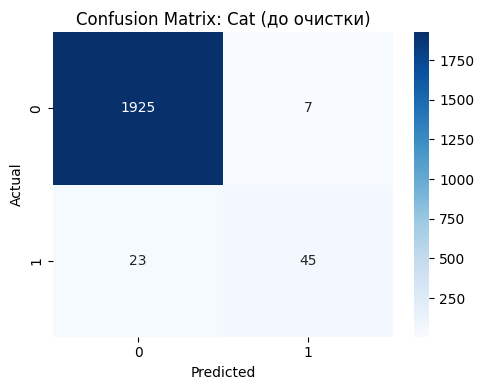

Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1932
           1       0.87      0.66      0.75        68

    accuracy                           0.98      2000
   macro avg       0.93      0.83      0.87      2000
weighted avg       0.98      0.98      0.98      2000

ROC-AUC: 0.9792

Оценка модели: Lgb (до очистки)
Accuracy: 0.9860
Confusion Matrix:
[[1927    5]
 [  23   45]]


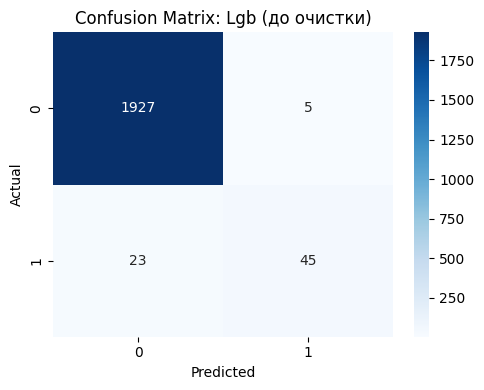

Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1932
           1       0.90      0.66      0.76        68

    accuracy                           0.99      2000
   macro avg       0.94      0.83      0.88      2000
weighted avg       0.99      0.99      0.98      2000

ROC-AUC: 0.9731

Оценка модели: Log Reg (до очистки)
Accuracy: 0.9680
Confusion Matrix:
[[1927    5]
 [  59    9]]


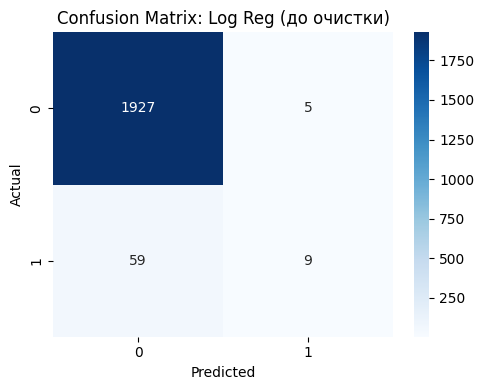

Classification Report:
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1932
           1       0.64      0.13      0.22        68

    accuracy                           0.97      2000
   macro avg       0.81      0.56      0.60      2000
weighted avg       0.96      0.97      0.96      2000

ROC-AUC: 0.9017

Оценка модели: Rf (до очистки)
Accuracy: 0.9850
Confusion Matrix:
[[1927    5]
 [  25   43]]


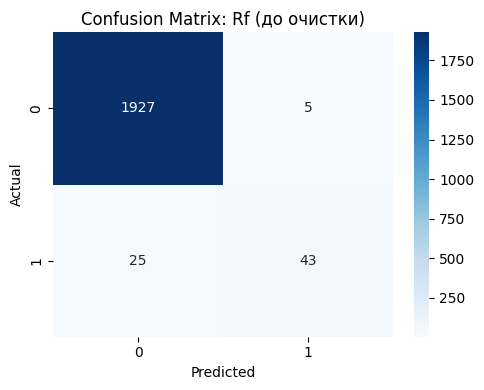

Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1932
           1       0.90      0.63      0.74        68

    accuracy                           0.98      2000
   macro avg       0.94      0.81      0.87      2000
weighted avg       0.98      0.98      0.98      2000

ROC-AUC: 0.9643

Оценка модели: Svm (до очистки)
Accuracy: 0.9660
Confusion Matrix:
[[1932    0]
 [  68    0]]


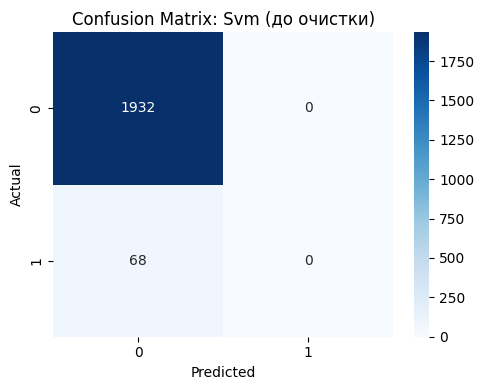

Classification Report:
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1932
           1       0.00      0.00      0.00        68

    accuracy                           0.97      2000
   macro avg       0.48      0.50      0.49      2000
weighted avg       0.93      0.97      0.95      2000

ROC-AUC: 0.8686

Оценка модели: Xgb (до очистки)
Accuracy: 0.9870
Confusion Matrix:
[[1926    6]
 [  20   48]]


c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-pa

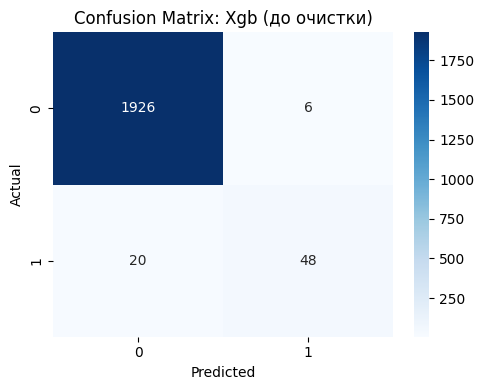

Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1932
           1       0.89      0.71      0.79        68

    accuracy                           0.99      2000
   macro avg       0.94      0.85      0.89      2000
weighted avg       0.99      0.99      0.99      2000

ROC-AUC: 0.9768

Оценка модели: Cat (после очистки)
Accuracy: 0.9873
Confusion Matrix:
[[1903    3]
 [  22   37]]


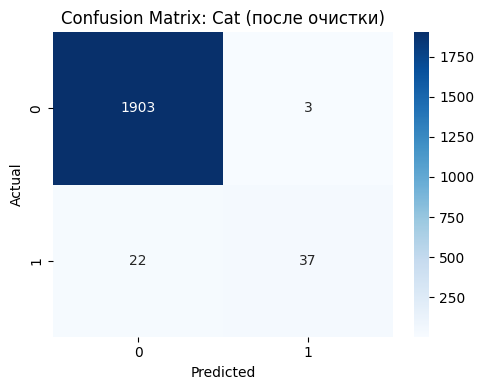

Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1906
           1       0.93      0.63      0.75        59

    accuracy                           0.99      1965
   macro avg       0.96      0.81      0.87      1965
weighted avg       0.99      0.99      0.99      1965

ROC-AUC: 0.9755

Оценка модели: Lgb (после очистки)
Accuracy: 0.9842
Confusion Matrix:
[[1897    9]
 [  22   37]]


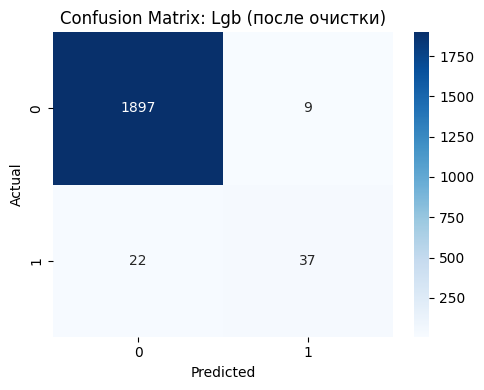

Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1906
           1       0.80      0.63      0.70        59

    accuracy                           0.98      1965
   macro avg       0.90      0.81      0.85      1965
weighted avg       0.98      0.98      0.98      1965

ROC-AUC: 0.9676

Оценка модели: Log Reg (после очистки)
Accuracy: 0.9700
Confusion Matrix:
[[1901    5]
 [  54    5]]


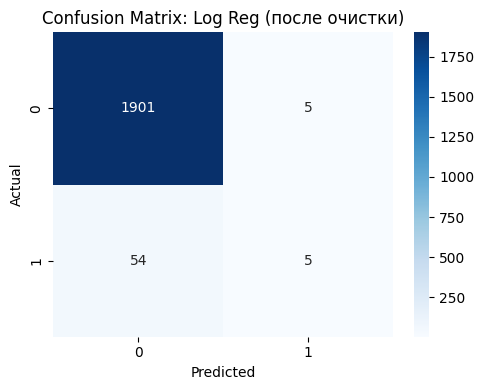

Classification Report:
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1906
           1       0.50      0.08      0.14        59

    accuracy                           0.97      1965
   macro avg       0.74      0.54      0.56      1965
weighted avg       0.96      0.97      0.96      1965

ROC-AUC: 0.9089

Оценка модели: Rf (после очистки)
Accuracy: 0.9842
Confusion Matrix:
[[1901    5]
 [  26   33]]


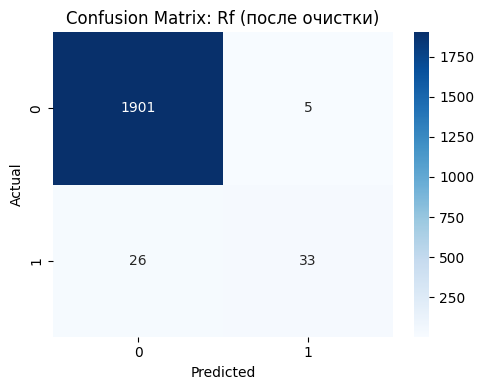

Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1906
           1       0.87      0.56      0.68        59

    accuracy                           0.98      1965
   macro avg       0.93      0.78      0.84      1965
weighted avg       0.98      0.98      0.98      1965

ROC-AUC: 0.9607

Оценка модели: Svm (после очистки)
Accuracy: 0.9700
Confusion Matrix:
[[1906    0]
 [  59    0]]


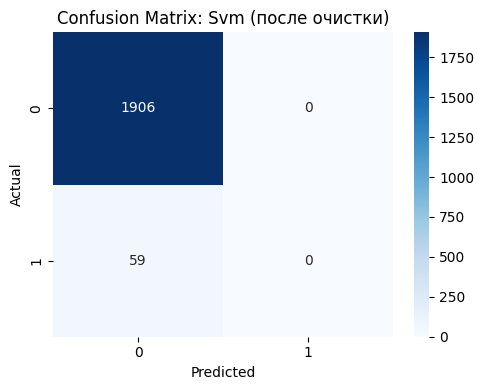

Classification Report:
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1906
           1       0.00      0.00      0.00        59

    accuracy                           0.97      1965
   macro avg       0.48      0.50      0.49      1965
weighted avg       0.94      0.97      0.96      1965

ROC-AUC: 0.8405

Оценка модели: Xgb (после очистки)
Accuracy: 0.9847
Confusion Matrix:
[[1897    9]
 [  21   38]]


c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-pa

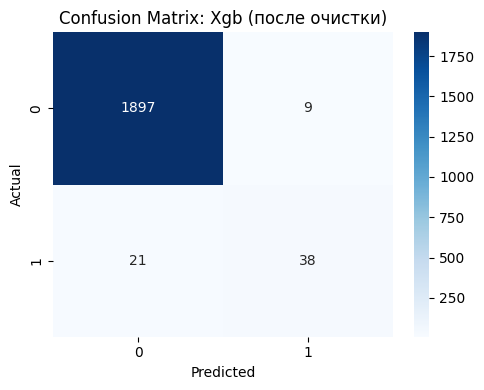

Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1906
           1       0.81      0.64      0.72        59

    accuracy                           0.98      1965
   macro avg       0.90      0.82      0.85      1965
weighted avg       0.98      0.98      0.98      1965

ROC-AUC: 0.9620

Оценка модели: Cat (до очистки)
Accuracy: 0.9815
Confusion Matrix:
[[  20    3    0    0    0    0]
 [   2 1922    3    1    0    2]
 [   0    9    7    0    0    0]
 [   0    3    1   14    0    0]
 [   0    4    0    0    0    0]
 [   0    7    2    0    0    0]]


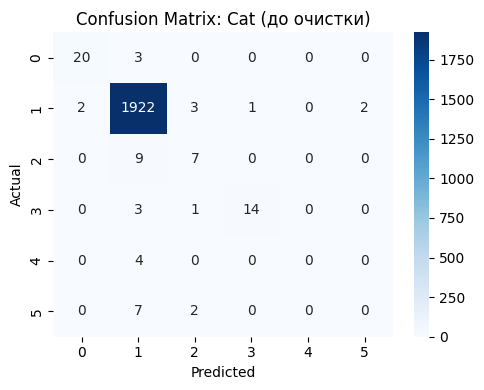

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.87      0.89        23
           1       0.99      1.00      0.99      1930
           2       0.54      0.44      0.48        16
           3       0.93      0.78      0.85        18
           4       0.00      0.00      0.00         4
           5       0.00      0.00      0.00         9

    accuracy                           0.98      2000
   macro avg       0.56      0.51      0.54      2000
weighted avg       0.98      0.98      0.98      2000

ROC-AUC: 0.8945

Оценка модели: Lgb (до очистки)
Accuracy: 0.9835
Confusion Matrix:
[[  22    1    0    0    0    0]
 [   0 1924    4    1    0    1]
 [   0    9    7    0    0    0]
 [   0    3    1   14    0    0]
 [   0    4    0    0    0    0]
 [   0    7    2    0    0    0]]


c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-pa

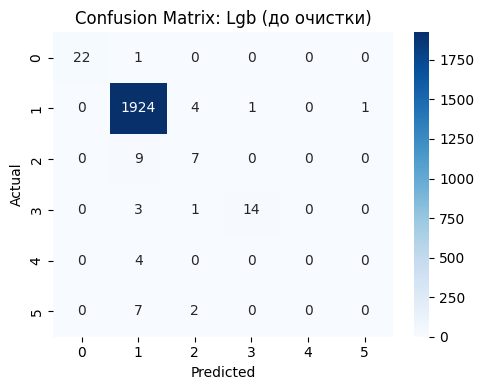

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.96      0.98        23
           1       0.99      1.00      0.99      1930
           2       0.50      0.44      0.47        16
           3       0.93      0.78      0.85        18
           4       0.00      0.00      0.00         4
           5       0.00      0.00      0.00         9

    accuracy                           0.98      2000
   macro avg       0.57      0.53      0.55      2000
weighted avg       0.98      0.98      0.98      2000

ROC-AUC: 0.8735

Оценка модели: Log Reg (до очистки)
Accuracy: 0.9755
Confusion Matrix:
[[   7   16    0    0    0    0]
 [   0 1928    1    1    0    0]
 [   0   12    4    0    0    0]
 [   0    4    2   12    0    0]
 [   0    4    0    0    0    0]
 [   0    7    2    0    0    0]]


c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-pa

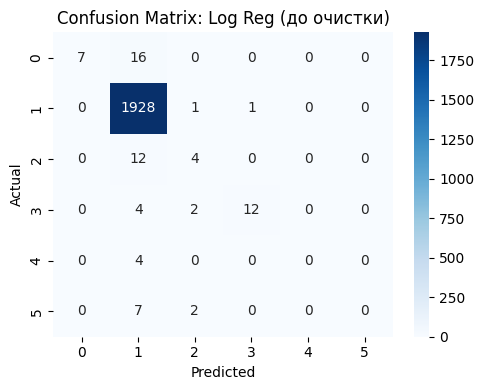

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.30      0.47        23
           1       0.98      1.00      0.99      1930
           2       0.44      0.25      0.32        16
           3       0.92      0.67      0.77        18
           4       0.00      0.00      0.00         4
           5       0.00      0.00      0.00         9

    accuracy                           0.98      2000
   macro avg       0.56      0.37      0.42      2000
weighted avg       0.97      0.98      0.97      2000

ROC-AUC: 0.9011

Оценка модели: Rf (до очистки)
Accuracy: 0.9830
Confusion Matrix:
[[  18    5    0    0    0    0]
 [   1 1926    1    2    0    0]
 [   0    8    8    0    0    0]
 [   1    3    0   14    0    0]
 [   0    4    0    0    0    0]
 [   0    7    2    0    0    0]]


c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-pa

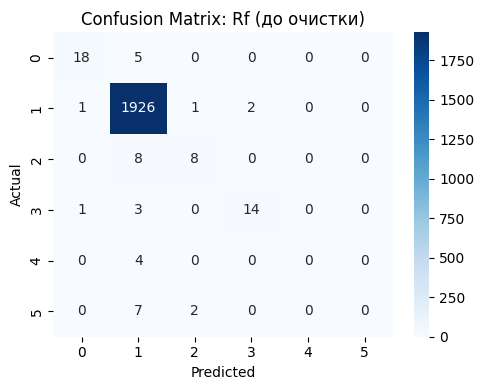

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.78      0.84        23
           1       0.99      1.00      0.99      1930
           2       0.73      0.50      0.59        16
           3       0.88      0.78      0.82        18
           4       0.00      0.00      0.00         4
           5       0.00      0.00      0.00         9

    accuracy                           0.98      2000
   macro avg       0.58      0.51      0.54      2000
weighted avg       0.98      0.98      0.98      2000

ROC-AUC: 0.8918

Оценка модели: Svm (до очистки)
Accuracy: 0.9760
Confusion Matrix:
[[   9   14    0    0    0    0]
 [   2 1924    3    1    0    0]
 [   0   11    5    0    0    0]
 [   0    2    2   14    0    0]
 [   0    4    0    0    0    0]
 [   0    7    2    0    0    0]]


c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-pa

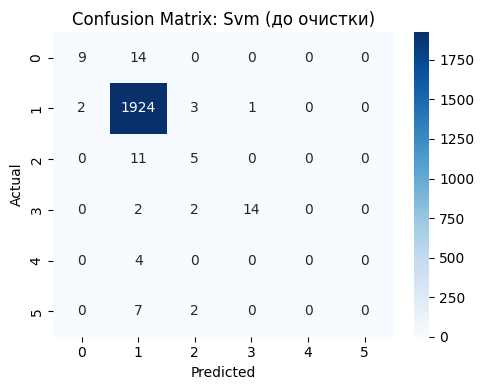

Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.39      0.53        23
           1       0.98      1.00      0.99      1930
           2       0.42      0.31      0.36        16
           3       0.93      0.78      0.85        18
           4       0.00      0.00      0.00         4
           5       0.00      0.00      0.00         9

    accuracy                           0.98      2000
   macro avg       0.52      0.41      0.45      2000
weighted avg       0.97      0.98      0.97      2000

ROC-AUC: 0.8845

Оценка модели: Xgb (до очистки)
Accuracy: 0.9825
Confusion Matrix:
[[  21    2    0    0    0    0]
 [   1 1920    6    2    0    1]
 [   0    6   10    0    0    0]
 [   0    4    0   14    0    0]
 [   0    4    0    0    0    0]
 [   0    7    2    0    0    0]]


c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-pa

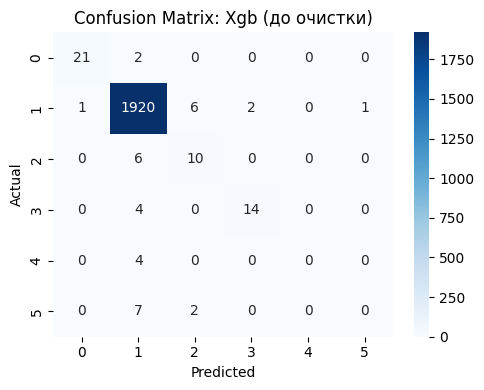

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.91      0.93        23
           1       0.99      0.99      0.99      1930
           2       0.56      0.62      0.59        16
           3       0.88      0.78      0.82        18
           4       0.00      0.00      0.00         4
           5       0.00      0.00      0.00         9

    accuracy                           0.98      2000
   macro avg       0.56      0.55      0.56      2000
weighted avg       0.98      0.98      0.98      2000

ROC-AUC: 0.8755

Оценка модели: Cat (после очистки)
Accuracy: 0.9842
Confusion Matrix:
[[  21    2    0    0    0    0]
 [   1 1901    2    0    0    0]
 [   0    9    7    0    0    0]
 [   0    3    1    5    0    0]
 [   0    4    0    0    0    0]
 [   0    8    1    0    0    0]]


c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-pa

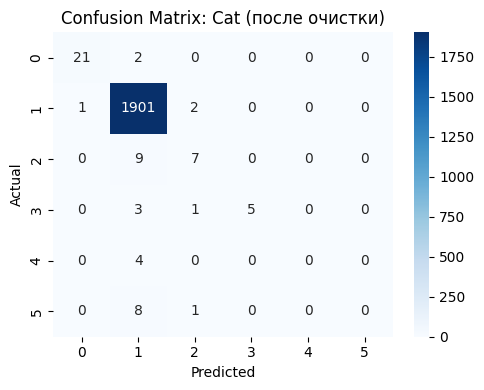

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.91      0.93        23
           1       0.99      1.00      0.99      1904
           2       0.64      0.44      0.52        16
           3       1.00      0.56      0.71         9
           4       0.00      0.00      0.00         4
           5       0.00      0.00      0.00         9

    accuracy                           0.98      1965
   macro avg       0.60      0.48      0.53      1965
weighted avg       0.98      0.98      0.98      1965

ROC-AUC: 0.8858

Оценка модели: Lgb (после очистки)
Accuracy: 0.9827
Confusion Matrix:
[[  20    3    0    0    0    0]
 [   0 1898    4    0    0    2]
 [   0    9    7    0    0    0]
 [   0    2    1    6    0    0]
 [   0    4    0    0    0    0]
 [   0    8    0    1    0    0]]


c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-pa

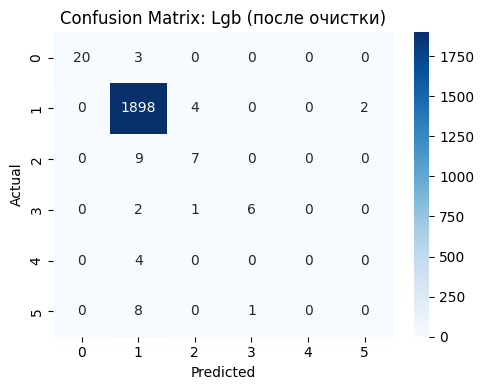

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.87      0.93        23
           1       0.99      1.00      0.99      1904
           2       0.58      0.44      0.50        16
           3       0.86      0.67      0.75         9
           4       0.00      0.00      0.00         4
           5       0.00      0.00      0.00         9

    accuracy                           0.98      1965
   macro avg       0.57      0.50      0.53      1965
weighted avg       0.98      0.98      0.98      1965

ROC-AUC: 0.9247

Оценка модели: Log Reg (после очистки)
Accuracy: 0.9781
Confusion Matrix:
[[   9   14    0    0    0    0]
 [   1 1903    0    0    0    0]
 [   0   12    4    0    0    0]
 [   0    2    1    6    0    0]
 [   0    4    0    0    0    0]
 [   0    8    1    0    0    0]]


c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-pa

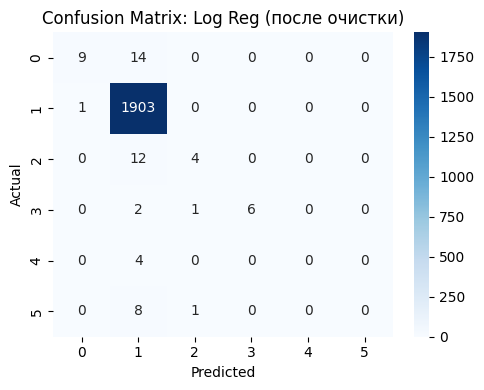

c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-pa

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.39      0.55        23
           1       0.98      1.00      0.99      1904
           2       0.67      0.25      0.36        16
           3       1.00      0.67      0.80         9
           4       0.00      0.00      0.00         4
           5       0.00      0.00      0.00         9

    accuracy                           0.98      1965
   macro avg       0.59      0.38      0.45      1965
weighted avg       0.97      0.98      0.97      1965

ROC-AUC: 0.9087

Оценка модели: Rf (после очистки)
Accuracy: 0.9842
Confusion Matrix:
[[  20    3    0    0    0    0]
 [   0 1903    1    0    0    0]
 [   0   11    5    0    0    0]
 [   0    2    1    6    0    0]
 [   0    4    0    0    0    0]
 [   0    8    1    0    0    0]]


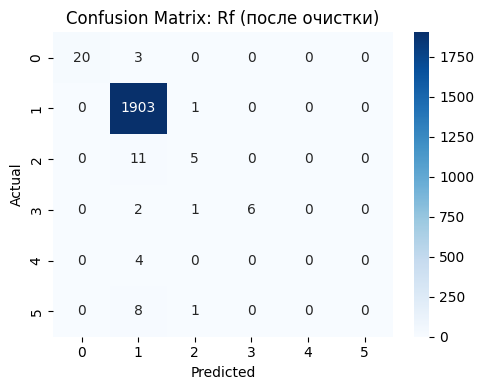

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.87      0.93        23
           1       0.99      1.00      0.99      1904
           2       0.62      0.31      0.42        16
           3       1.00      0.67      0.80         9
           4       0.00      0.00      0.00         4
           5       0.00      0.00      0.00         9

    accuracy                           0.98      1965
   macro avg       0.60      0.47      0.52      1965
weighted avg       0.98      0.98      0.98      1965

ROC-AUC: 0.9101

Оценка модели: Svm (после очистки)
Accuracy: 0.9791
Confusion Matrix:
[[   9   14    0    0    0    0]
 [   0 1903    1    0    0    0]
 [   0   10    6    0    0    0]
 [   0    2    1    6    0    0]
 [   0    4    0    0    0    0]
 [   0    8    1    0    0    0]]


c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-pa

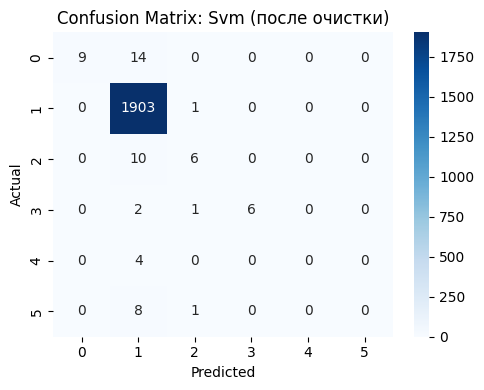

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.39      0.56        23
           1       0.98      1.00      0.99      1904
           2       0.67      0.38      0.48        16
           3       1.00      0.67      0.80         9
           4       0.00      0.00      0.00         4
           5       0.00      0.00      0.00         9

    accuracy                           0.98      1965
   macro avg       0.61      0.41      0.47      1965
weighted avg       0.97      0.98      0.97      1965

ROC-AUC: 0.9307

Оценка модели: Xgb (после очистки)
Accuracy: 0.9837
Confusion Matrix:
[[  20    3    0    0    0    0]
 [   0 1900    2    0    0    2]
 [   0    9    7    0    0    0]
 [   0    3    0    6    0    0]
 [   0    4    0    0    0    0]
 [   0    8    1    0    0    0]]


c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-pa

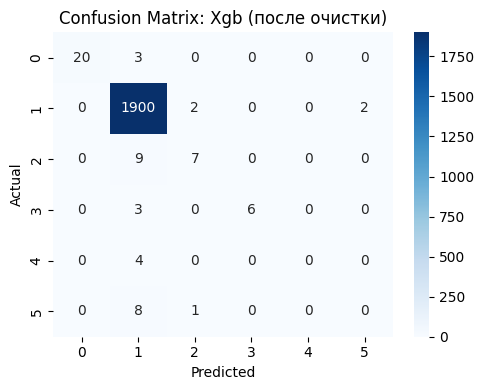

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.87      0.93        23
           1       0.99      1.00      0.99      1904
           2       0.70      0.44      0.54        16
           3       1.00      0.67      0.80         9
           4       0.00      0.00      0.00         4
           5       0.00      0.00      0.00         9

    accuracy                           0.98      1965
   macro avg       0.61      0.50      0.54      1965
weighted avg       0.98      0.98      0.98      1965

ROC-AUC: 0.9352


c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-pa

In [37]:
# Результаты
results_all = {
    "binary": {"до очистки": [], "после очистки": []},
    "multiclass": {"до очистки": [], "после очистки": []}
}

# Целевые данные
target_data = {
    "binary": {
        "до очистки": (X_test_bin_full, y_test_bin_full),
        "после очистки": (X_test_bin_clean, y_test_bin_clean)
    },
    "multiclass": {
        "до очистки": (X_test_multi_full, y_test_multi_full),
        "после очистки": (X_test_multi_clean, y_test_multi_clean)
    }
}

# Универсальная оценка
for task_type in ["binary", "multiclass"]:
    for status in ["до очистки", "после очистки"]:
        X_test, y_test = target_data[task_type][status]
        for name, model in all_models[task_type][status].items():
            res = evaluate_and_collect(model, X_test, y_test, name, multiclass=(task_type == "multiclass"))
            results_all[task_type][status].append(res)

#### **Шаг 6.3 Построение общего ROC-графика**

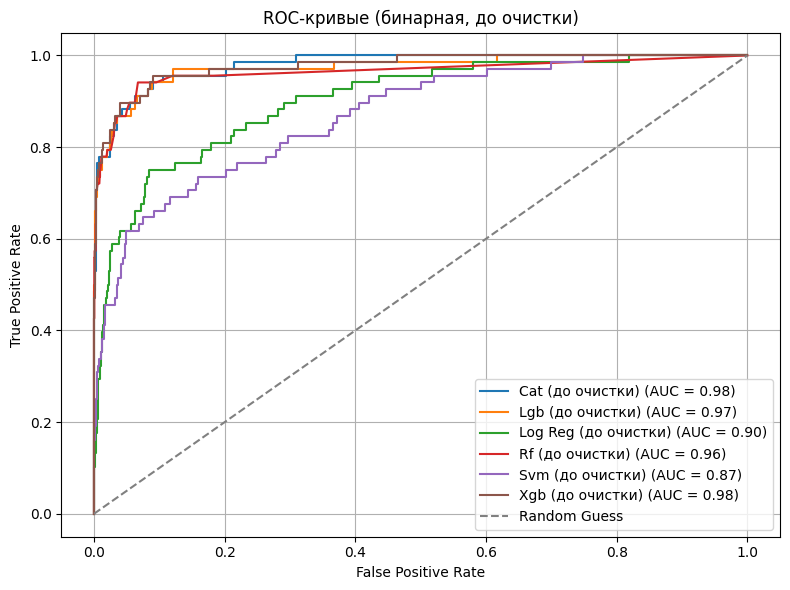

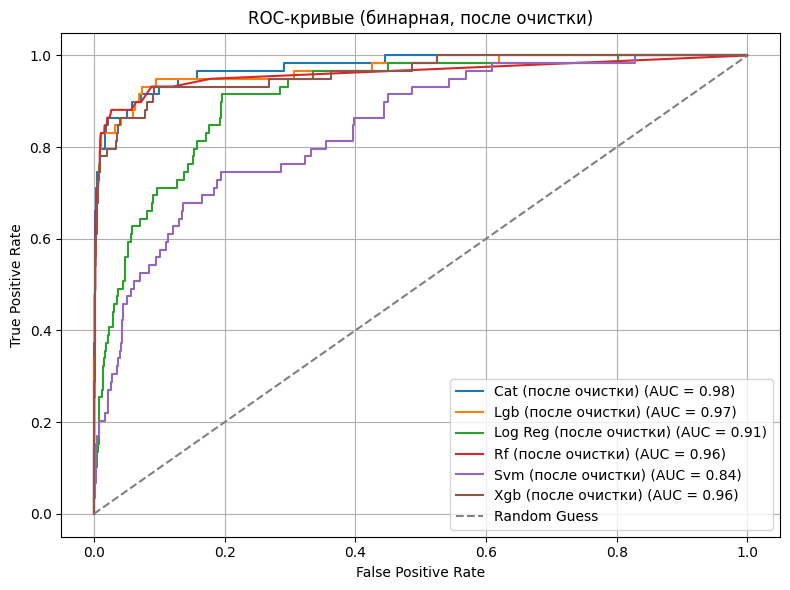

In [38]:
# Построение ROC-кривых (для бинарной классификации)
def plot_roc_curves(results, title="ROC-кривые моделей"):
    import matplotlib.pyplot as plt
    plt.figure(figsize=(8, 6))
    for res in results:
        if res["fpr"] is not None:
            plt.plot(res["fpr"], res["tpr"], label=f"{res['model']} (AUC = {res['auc']:.2f})")
    plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label="Random Guess")
    plt.title(title)
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# ROC-кривые (только для бинарной)
plot_roc_curves(results_all["binary"]["до очистки"], "ROC-кривые (бинарная, до очистки)")
plot_roc_curves(results_all["binary"]["после очистки"], "ROC-кривые (бинарная, после очистки)")


#### **Шаг 6.4 Построение barplot из собранных метрик**

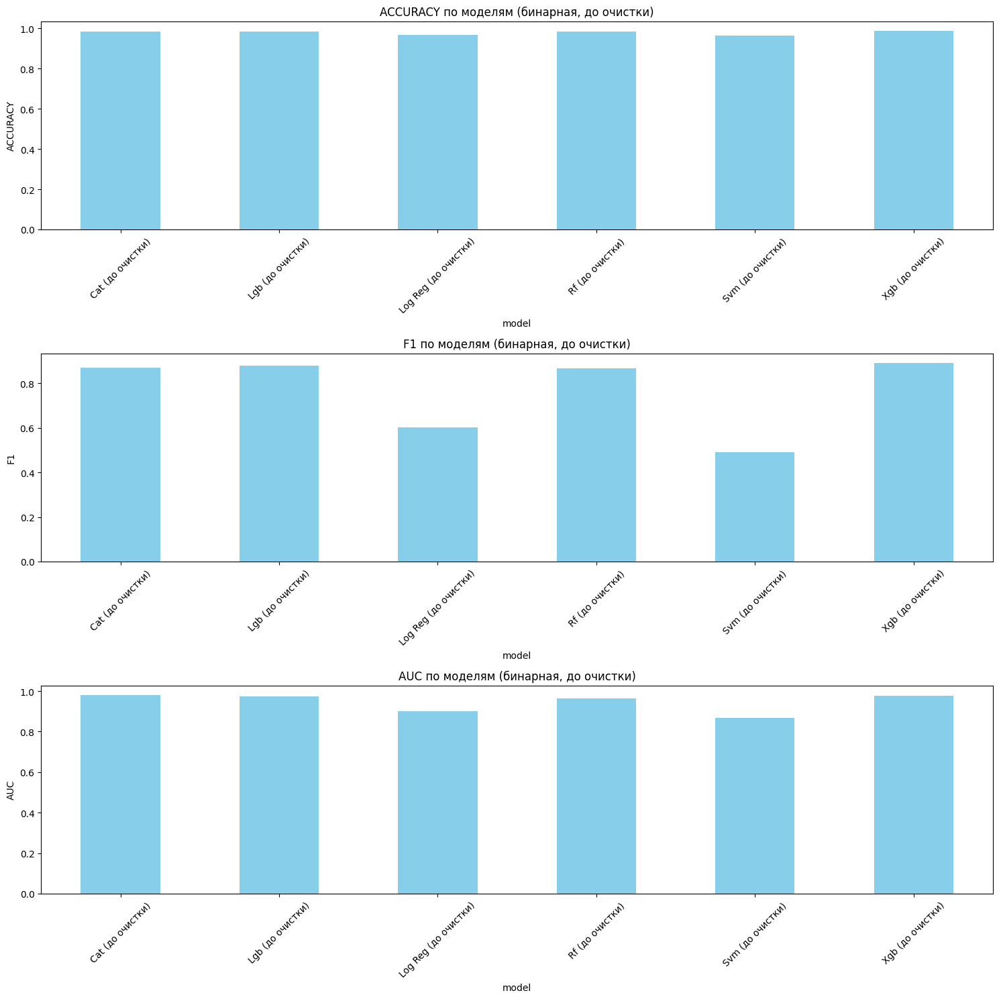

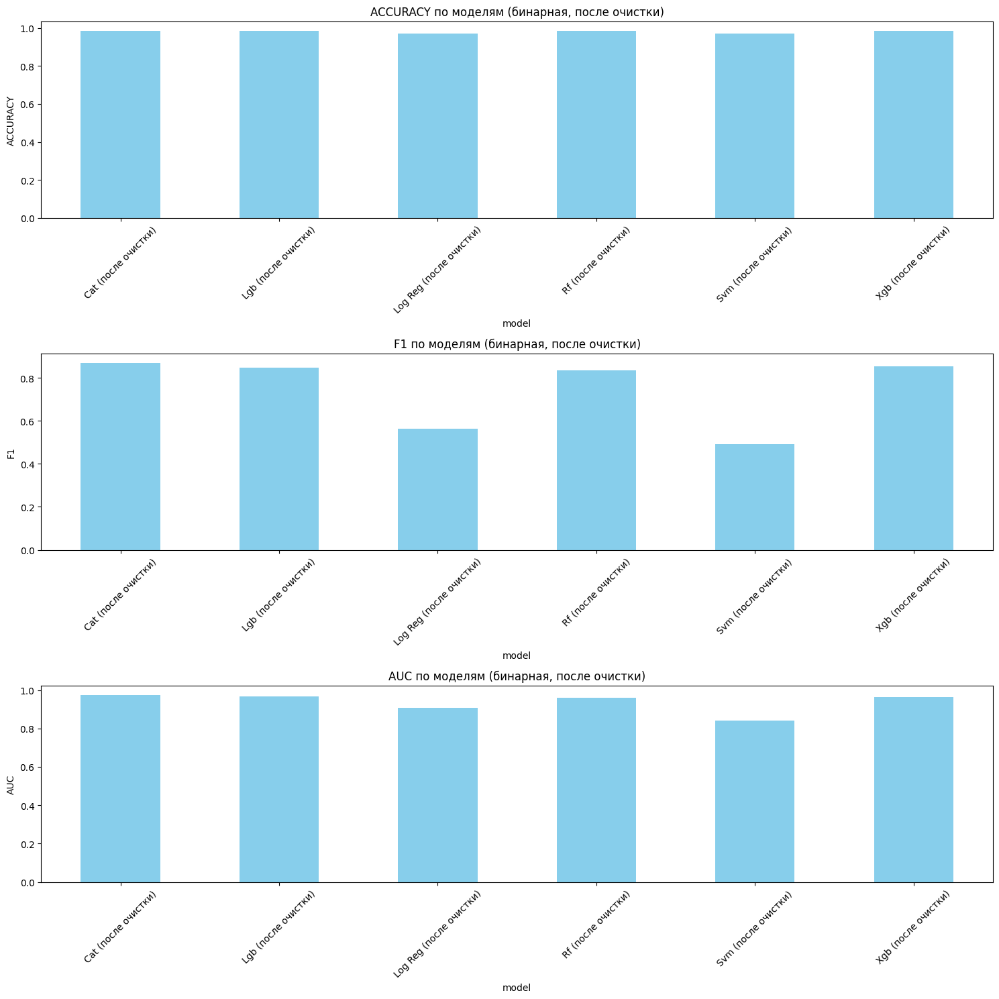

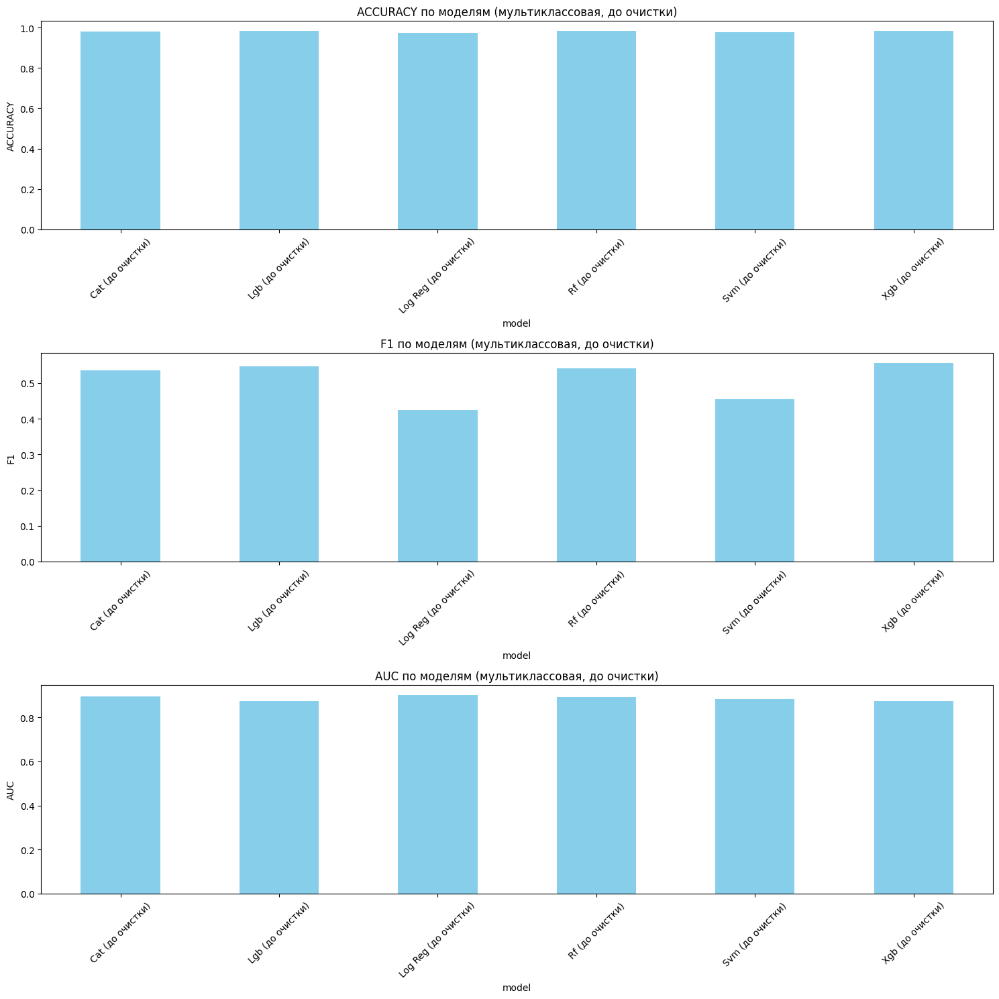

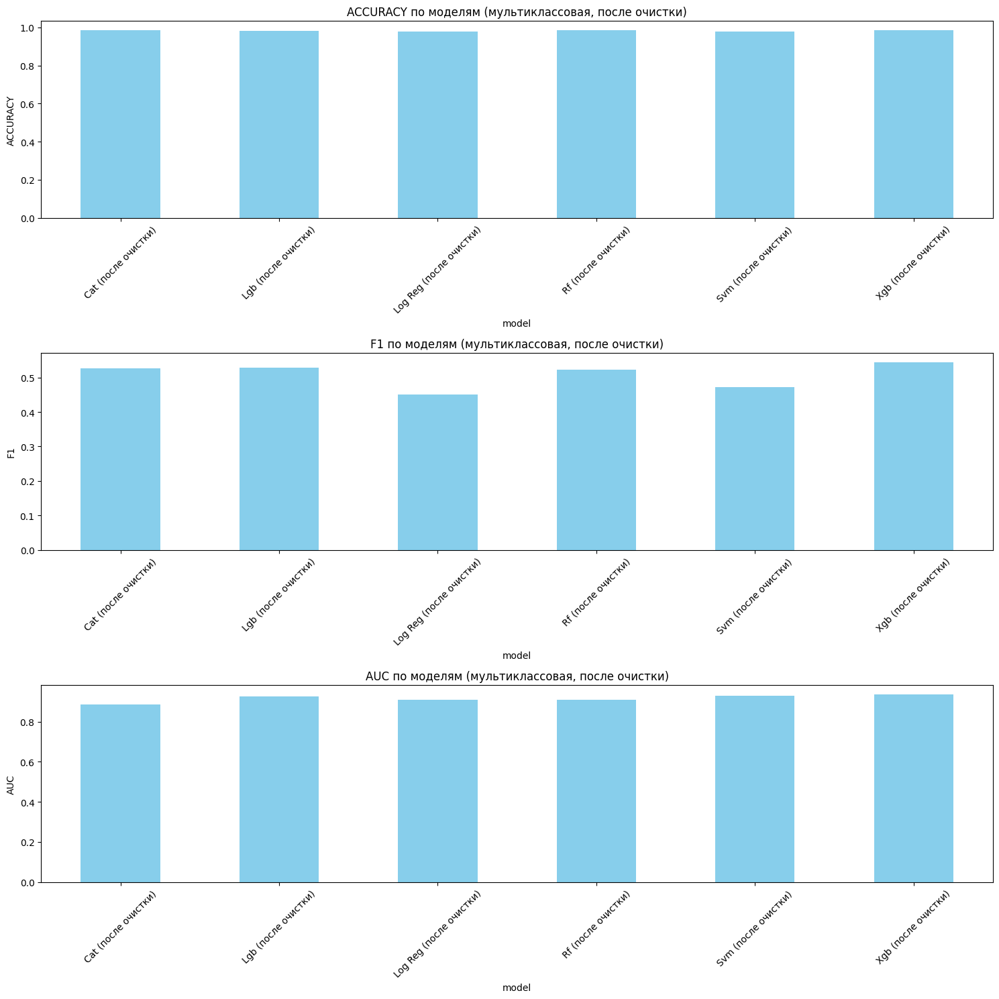

In [39]:
# Построение barplot по accuracy, f1, auc
def plot_metrics_bar(results, title_suffix=""):
    import pandas as pd
    import matplotlib.pyplot as plt

    df = pd.DataFrame(results)
    df.set_index("model", inplace=True)

    plt.figure(figsize=(15, 15))
    for i, metric in enumerate(["accuracy", "f1", "auc"], 1):
        plt.subplot(3, 1, i)
        df[metric].plot(kind='bar', color='skyblue')
        plt.title(f"{metric.upper()} по моделям {title_suffix}")
        plt.ylabel(metric.upper())
        plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Barplots
plot_metrics_bar(results_all["binary"]["до очистки"], "(бинарная, до очистки)")
plot_metrics_bar(results_all["binary"]["после очистки"], "(бинарная, после очистки)")
plot_metrics_bar(results_all["multiclass"]["до очистки"], "(мультиклассовая, до очистки)")
plot_metrics_bar(results_all["multiclass"]["после очистки"], "(мультиклассовая, после очистки)")


### **Шаг 7. Оптимизация обучения модели**

#### **Шаг 7.1 Оптимизация и сохранение всех моделей (бинарные и мультиклассовые)**

In [45]:
import os
import numpy as np
import joblib
import optuna
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier

# Создание папок для сохранения оптимизированных моделей
os.makedirs("saved_models/optimized_models/binary", exist_ok=True)
os.makedirs("saved_models/optimized_models/multiclass", exist_ok=True)

# Настройка Optuna
optuna.logging.set_verbosity(optuna.logging.WARNING)
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Определение задач
tasks = {
    "binary": (X_train_bin_clean, y_train_bin_clean, X_test_bin_clean, y_test_bin_clean),
    "multiclass": (X_train_multi_clean, y_train_multi_clean, X_test_multi_clean, y_test_multi_clean)
}

# Определение пространства поиска и моделей
model_definitions = {
    "logreg": lambda trial: LogisticRegression(
        C=trial.suggest_float("C", 1e-3, 100, log=True),
        solver=trial.suggest_categorical("solver", ["lbfgs", "liblinear"]),
        class_weight="balanced",
        max_iter=1000
    ),
    "rf": lambda trial: RandomForestClassifier(
        n_estimators=trial.suggest_int("n_estimators", 50, 300),
        max_depth=trial.suggest_int("max_depth", 3, 20),
        min_samples_split=trial.suggest_int("min_samples_split", 2, 10),
        min_samples_leaf=trial.suggest_int("min_samples_leaf", 1, 5),
        class_weight="balanced",
        n_jobs=-1,
        random_state=42
    ),
    "svm": lambda trial: SVC(
        C=trial.suggest_float("C", 1e-3, 100, log=True),
        kernel=trial.suggest_categorical("kernel", ["linear", "rbf"]),
        gamma=trial.suggest_categorical("gamma", ["scale", "auto"]),
        probability=True,
        class_weight="balanced"
    ),
    "xgb": lambda trial, y_train: XGBClassifier(
        n_estimators=trial.suggest_int("n_estimators", 50, 300),
        max_depth=trial.suggest_int("max_depth", 3, 10),
        learning_rate=trial.suggest_float("learning_rate", 0.01, 0.3),
        subsample=trial.suggest_float("subsample", 0.5, 1.0),
        colsample_bytree=trial.suggest_float("colsample_bytree", 0.5, 1.0),
        scale_pos_weight=(y_train == 0).sum() / (y_train == 1).sum() if len(np.unique(y_train)) == 2 else 1.0,
        use_label_encoder=False,
        eval_metric="logloss",
        random_state=42
    ),
    "cat": lambda trial, task_name="binary": CatBoostClassifier(
        iterations=trial.suggest_int("iterations", 50, 300),
        depth=trial.suggest_int("depth", 4, 10),
        learning_rate=trial.suggest_float("learning_rate", 0.01, 0.3),
        scale_pos_weight=trial.suggest_float("scale_pos_weight", 1.0, 10.0) if task_name == "binary" else None,
        verbose=0,
        random_seed=42
    ),
    "lgb": lambda trial: LGBMClassifier(
        n_estimators=trial.suggest_int("n_estimators", 50, 300),
        max_depth=trial.suggest_int("max_depth", 3, 15),
        learning_rate=trial.suggest_float("learning_rate", 0.01, 0.3),
        num_leaves=trial.suggest_int("num_leaves", 15, 150),
        class_weight=trial.suggest_categorical("class_weight", ["balanced", None]),
        random_state=42
    )
}

#### **Шаг 7.2 Цикл оптимизации по всем моделям и задачам**

In [46]:
# Оптимизация моделей
for task_name, (X_train, y_train, _, _) in tasks.items():
    for model_key, model_fn in model_definitions.items():
        path = f"saved_models/optimized_models/{task_name}/{model_key}_opt.pkl"

        # Пропуск, если модель уже сохранена
        if os.path.exists(path):
            print(f"{task_name.upper()} - {model_key} already exists. Skipping optimization.")
            continue

        # Определение целевой функции
        def objective(trial):
            if model_key == "xgb":
                model = model_fn(trial, y_train)
            elif model_key == "cat":
                model = model_fn(trial, task_name)
            else:
                model = model_fn(trial)

            score = cross_val_score(
                model,
                X_train,
                y_train,
                cv=cv,
                scoring="roc_auc_ovr" if task_name == "multiclass" else "roc_auc"
            ).mean()
            return score

        # Запуск Optuna
        study = optuna.create_study(direction="maximize")
        study.optimize(objective, n_trials=30)

        # Обучение на лучших параметрах
        best_params = study.best_params
        fixed_trial = optuna.trial.FixedTrial(best_params)

        if model_key == "xgb":
            model = model_fn(fixed_trial, y_train)
        elif model_key == "cat":
            model = model_fn(fixed_trial, task_name)
        else:
            model = model_fn(fixed_trial)

        model.fit(X_train, y_train)
        joblib.dump(model, path)
        print(f"{task_name.upper()} - {model_key} optimized and saved to {path}")

BINARY - logreg already exists. Skipping optimization.
BINARY - rf already exists. Skipping optimization.
BINARY - svm already exists. Skipping optimization.
BINARY - xgb already exists. Skipping optimization.
BINARY - cat already exists. Skipping optimization.
BINARY - lgb already exists. Skipping optimization.
MULTICLASS - logreg already exists. Skipping optimization.
MULTICLASS - rf already exists. Skipping optimization.
MULTICLASS - svm already exists. Skipping optimization.
MULTICLASS - xgb already exists. Skipping optimization.
MULTICLASS - cat optimized and saved to saved_models/optimized_models/multiclass/cat_opt.pkl
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000191 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 918
[LightGBM] [Info] Number of data points in the train set: 6285, number of used features: 5
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start tra

#### **7.3 Оценка оптимизированных моделей**


======= BINARY TASK EVALUATION =======


Task: BINARY – CAT (после оптимизации)
Accuracy: 0.9883
Confusion Matrix:
[[1898    8]
 [  15   44]]


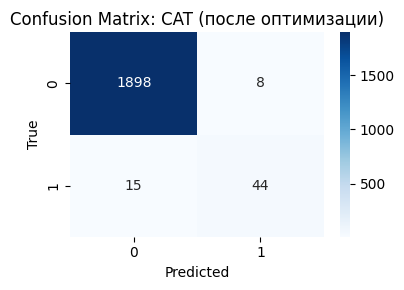

Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1906
           1       0.85      0.75      0.79        59

    accuracy                           0.99      1965
   macro avg       0.92      0.87      0.89      1965
weighted avg       0.99      0.99      0.99      1965

ROC-AUC: 0.9768

Task: BINARY – LGB (после оптимизации)
Accuracy: 0.9863
Confusion Matrix:
[[1898    8]
 [  19   40]]


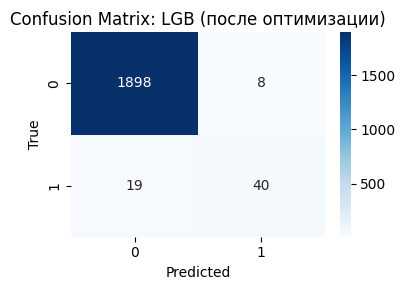

Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1906
           1       0.83      0.68      0.75        59

    accuracy                           0.99      1965
   macro avg       0.91      0.84      0.87      1965
weighted avg       0.99      0.99      0.99      1965

ROC-AUC: 0.9656

Task: BINARY – LOGREG (после оптимизации)
Accuracy: 0.8234
Confusion Matrix:
[[1571  335]
 [  12   47]]


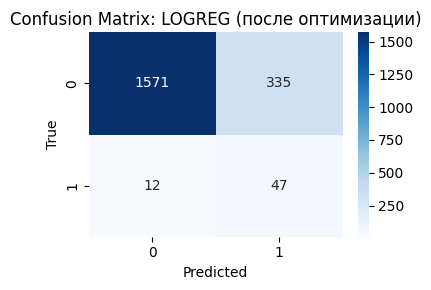

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.82      0.90      1906
           1       0.12      0.80      0.21        59

    accuracy                           0.82      1965
   macro avg       0.56      0.81      0.56      1965
weighted avg       0.97      0.82      0.88      1965

ROC-AUC: 0.9031

Task: BINARY – RF (после оптимизации)
Accuracy: 0.9832
Confusion Matrix:
[[1888   18]
 [  15   44]]


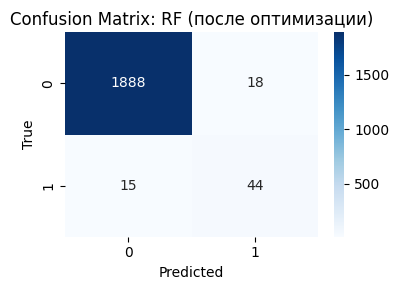

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1906
           1       0.71      0.75      0.73        59

    accuracy                           0.98      1965
   macro avg       0.85      0.87      0.86      1965
weighted avg       0.98      0.98      0.98      1965

ROC-AUC: 0.9598

Task: BINARY – SVM (после оптимизации)
Accuracy: 0.9389
Confusion Matrix:
[[1794  112]
 [   8   51]]


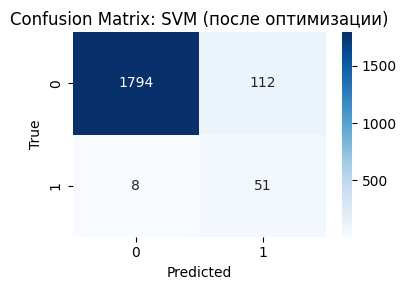

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.94      0.97      1906
           1       0.31      0.86      0.46        59

    accuracy                           0.94      1965
   macro avg       0.65      0.90      0.71      1965
weighted avg       0.98      0.94      0.95      1965

ROC-AUC: 0.9689

Task: BINARY – XGB (после оптимизации)
Accuracy: 0.9807
Confusion Matrix:
[[1883   23]
 [  15   44]]


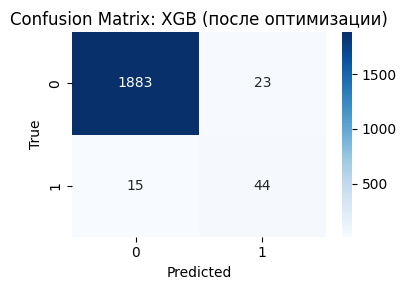

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1906
           1       0.66      0.75      0.70        59

    accuracy                           0.98      1965
   macro avg       0.82      0.87      0.84      1965
weighted avg       0.98      0.98      0.98      1965

ROC-AUC: 0.9696


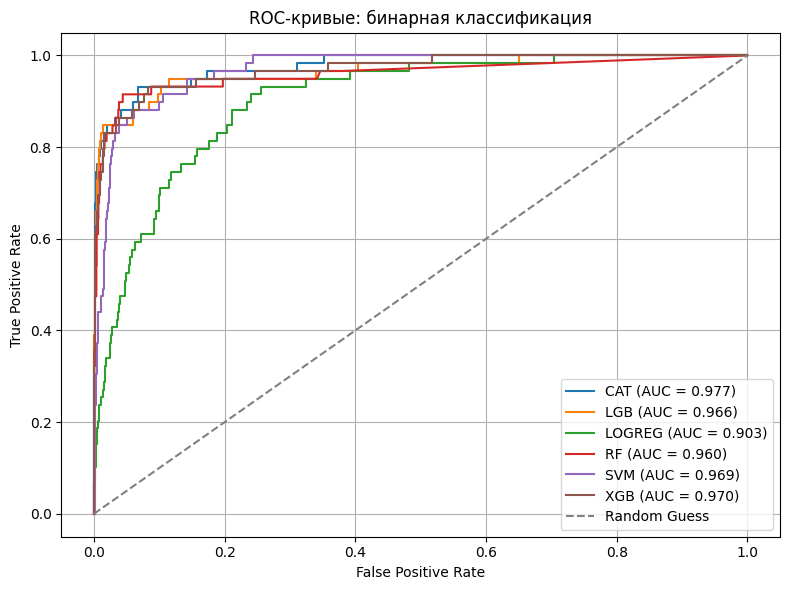


======= MULTICLASS TASK EVALUATION =======


Task: MULTICLASS – CAT (после оптимизации)
Accuracy: 0.9822
Confusion Matrix:
[[  17    6    0    0    0    0]
 [   0 1903    1    0    0    0]
 [   0   10    6    0    0    0]
 [   0    4    1    4    0    0]
 [   0    4    0    0    0    0]
 [   0    8    1    0    0    0]]


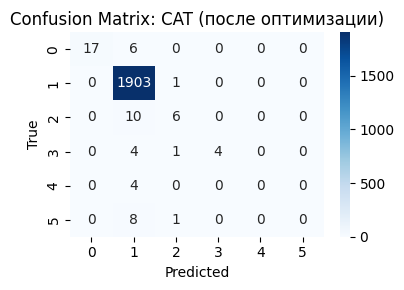

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.74      0.85        23
           1       0.98      1.00      0.99      1904
           2       0.67      0.38      0.48        16
           3       1.00      0.44      0.62         9
           4       0.00      0.00      0.00         4
           5       0.00      0.00      0.00         9

    accuracy                           0.98      1965
   macro avg       0.61      0.43      0.49      1965
weighted avg       0.97      0.98      0.98      1965

ROC-AUC (macro): 0.8903

Task: MULTICLASS – LGB (после оптимизации)
Accuracy: 0.9272
Confusion Matrix:
[[  23    0    0    0    0    0]
 [  12 1770   19   10   46   47]
 [   0    1   14    1    0    0]
 [   0    0    1    8    0    0]
 [   0    2    0    0    1    1]
 [   0    2    1    0    0    6]]


c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-pa

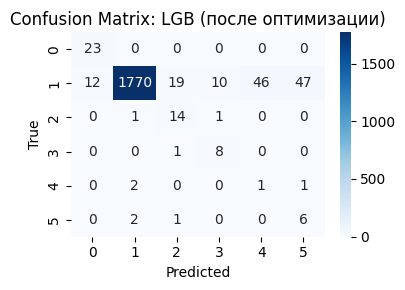

Classification Report:
              precision    recall  f1-score   support

           0       0.66      1.00      0.79        23
           1       1.00      0.93      0.96      1904
           2       0.40      0.88      0.55        16
           3       0.42      0.89      0.57         9
           4       0.02      0.25      0.04         4
           5       0.11      0.67      0.19         9

    accuracy                           0.93      1965
   macro avg       0.43      0.77      0.52      1965
weighted avg       0.98      0.93      0.95      1965

ROC-AUC (macro): 0.8942

Task: MULTICLASS – LOGREG (после оптимизации)
Accuracy: 0.9664
Confusion Matrix:
[[  19    3    0    0    0    1]
 [  19 1853   11    3    6   12]
 [   0    0   16    0    0    0]
 [   0    0    1    8    0    0]
 [   0    3    0    0    1    0]
 [   0    6    1    0    0    2]]


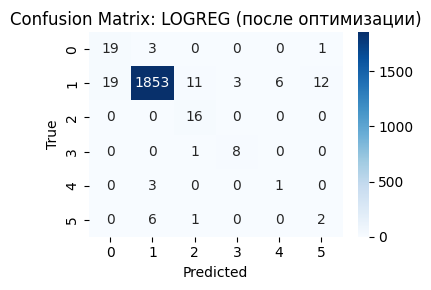

Classification Report:
              precision    recall  f1-score   support

           0       0.50      0.83      0.62        23
           1       0.99      0.97      0.98      1904
           2       0.55      1.00      0.71        16
           3       0.73      0.89      0.80         9
           4       0.14      0.25      0.18         4
           5       0.13      0.22      0.17         9

    accuracy                           0.97      1965
   macro avg       0.51      0.69      0.58      1965
weighted avg       0.98      0.97      0.97      1965

ROC-AUC (macro): 0.8922

Task: MULTICLASS – RF (после оптимизации)
Accuracy: 0.9786
Confusion Matrix:
[[  21    2    0    0    0    0]
 [   4 1891    3    1    0    5]
 [   0    9    7    0    0    0]
 [   0    3    2    4    0    0]
 [   0    4    0    0    0    0]
 [   0    8    1    0    0    0]]


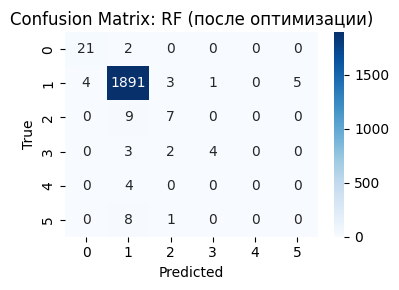

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.91      0.88        23
           1       0.99      0.99      0.99      1904
           2       0.54      0.44      0.48        16
           3       0.80      0.44      0.57         9
           4       0.00      0.00      0.00         4
           5       0.00      0.00      0.00         9

    accuracy                           0.98      1965
   macro avg       0.53      0.46      0.49      1965
weighted avg       0.97      0.98      0.98      1965

ROC-AUC (macro): 0.9021

Task: MULTICLASS – SVM (после оптимизации)


c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-pa

Accuracy: 0.6239
Confusion Matrix:
[[  23    0    0    0    0    0]
 [  64 1174   27    6  489  144]
 [   0    0   13    0    1    2]
 [   0    0    0    9    0    0]
 [   0    2    1    0    0    1]
 [   0    1    0    1    0    7]]


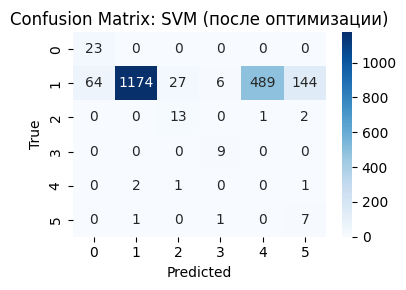

Classification Report:
              precision    recall  f1-score   support

           0       0.26      1.00      0.42        23
           1       1.00      0.62      0.76      1904
           2       0.32      0.81      0.46        16
           3       0.56      1.00      0.72         9
           4       0.00      0.00      0.00         4
           5       0.05      0.78      0.09         9

    accuracy                           0.62      1965
   macro avg       0.36      0.70      0.41      1965
weighted avg       0.97      0.62      0.75      1965

ROC-AUC (macro): 0.9173

Task: MULTICLASS – XGB (после оптимизации)
Accuracy: 0.9837
Confusion Matrix:
[[  19    4    0    0    0    0]
 [   0 1903    1    0    0    0]
 [   0    9    7    0    0    0]
 [   0    4    1    4    0    0]
 [   0    4    0    0    0    0]
 [   0    8    1    0    0    0]]


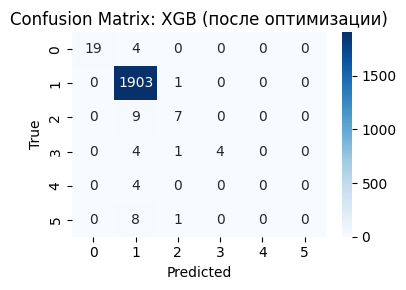

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.83      0.90        23
           1       0.98      1.00      0.99      1904
           2       0.70      0.44      0.54        16
           3       1.00      0.44      0.62         9
           4       0.00      0.00      0.00         4
           5       0.00      0.00      0.00         9

    accuracy                           0.98      1965
   macro avg       0.61      0.45      0.51      1965
weighted avg       0.98      0.98      0.98      1965

ROC-AUC (macro): 0.9321


c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\venv\Lib\site-pa

In [51]:
import os
import joblib
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    classification_report,
    roc_auc_score,
    roc_curve
)

# Evaluation tasks with test data
evaluation_tasks = {
    "binary": (X_test_bin_clean, y_test_bin_clean),
    "multiclass": (X_test_multi_clean, y_test_multi_clean)
}

# Model evaluation function
def evaluate_model(model, X_test, y_test, model_name, task_name):
    print(f"\nTask: {task_name.upper()} – {model_name} (после оптимизации)")

    # Getting predictions
    y_pred = model.predict(X_test)

    # Getting predicted probabilities (if available)
    y_proba = None
    if hasattr(model, "predict_proba"):
        y_proba = model.predict_proba(X_test)
        if task_name == "binary":
            y_proba = y_proba[:, 1]  # Use prob of class 1

    # Accuracy
    acc = accuracy_score(y_test, y_pred)
    print(f"Accuracy: {acc:.4f}")

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    print("Confusion Matrix:")
    print(cm)
    plt.figure(figsize=(4, 3))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f"Confusion Matrix: {model_name} (после оптимизации)")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()

    # Classification Report
    print("Classification Report:")
    print(classification_report(y_test, y_pred))

    # ROC-AUC
    if y_proba is not None:
        if task_name == "binary":
            roc_auc = roc_auc_score(y_test, y_proba)
            print(f"ROC-AUC: {roc_auc:.4f}")
            fpr, tpr, _ = roc_curve(y_test, y_proba)
            return model_name, fpr, tpr, roc_auc
        else:
            roc_auc = roc_auc_score(y_test, y_proba, multi_class="ovr", average="macro")
            print(f"ROC-AUC (macro): {roc_auc:.4f}")
    return None

# Main loop for tasks
for task_name, (X_test, y_test) in evaluation_tasks.items():
    roc_data = []
    models_path = f"saved_models/optimized_models/{task_name}"

    print(f"\n======= {task_name.upper()} TASK EVALUATION =======\n")

    for filename in os.listdir(models_path):
        if filename.endswith(".pkl"):
            model_path = os.path.join(models_path, filename)
            model_name = filename.replace("_opt.pkl", "").upper()

            model = joblib.load(model_path)
            result = evaluate_model(model, X_test, y_test, model_name, task_name)

            if task_name == "binary" and result is not None:
                roc_data.append(result)

    # ROC curve for binary classification
    if task_name == "binary":
        plt.figure(figsize=(8, 6))
        for name, fpr, tpr, auc in roc_data:
            plt.plot(fpr, tpr, label=f"{name} (AUC = {auc:.3f})")
        plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Guess')
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title("ROC-кривые: бинарная классификация")
        plt.legend(loc="lower right")
        plt.grid(True)
        plt.tight_layout()
        plt.show()

## **Часть 3. Внедрение ClearML в проект**

### **Шаг 1. Установка переменных среды для ClearML**

In [60]:
# Установка переменных среды для подключения к серверу ClearML
%env CLEARML_WEB_HOST=https://app.clear.ml/
%env CLEARML_API_HOST=https://api.clear.ml
%env CLEARML_FILES_HOST=https://files.clear.ml
%env CLEARML_API_ACCESS_KEY=6TRR5HVLC6ZMXFI9KPR2YFF0QXEITU
%env CLEARML_API_SECRET_KEY=KdAstN2z_UKyyguNYLjpxrvt-0rm8vVtXOyaUf5ZoxCZoTV2Gq-vTdUH0S2eS1WWHy4

env: CLEARML_WEB_HOST=https://app.clear.ml/
env: CLEARML_API_HOST=https://api.clear.ml
env: CLEARML_FILES_HOST=https://files.clear.ml
env: CLEARML_API_ACCESS_KEY=6TRR5HVLC6ZMXFI9KPR2YFF0QXEITU
env: CLEARML_API_SECRET_KEY=KdAstN2z_UKyyguNYLjpxrvt-0rm8vVtXOyaUf5ZoxCZoTV2Gq-vTdUH0S2eS1WWHy4


### **Шаг 2. Загрузка датасета в ClearML**

In [61]:
from clearml import Dataset

# Создание нового датасета
dataset = Dataset.create(
    dataset_name="Predictive Maintenance Dataset",  # Имя, по которому ты его потом найдёшь
    dataset_project="Predictive Maintenance",       # Проект, в котором будет храниться датасет
    dataset_version="1.0"                           # Версия (можно менять при обновлениях)
)

# Добавление папки с данными
dataset.add_files(path=r"C:\Users\north\Документы\2 Курсы\КАИ. ЦК. Data science. Искусственный интеллект\Проектная работа\predictive_maintenance_project\data\predictive_maintenance.csv")

# Загрузка в ClearML Storage
dataset.upload()

# Финализация
dataset.finalize()

ClearML results page: https://app.clear.ml/projects/99661613819f4159b270093522dd739e/experiments/824f49555f664560abf6a218f2adb8c3/output/log
ClearML dataset page: https://app.clear.ml/datasets/simple/99661613819f4159b270093522dd739e/experiments/824f49555f664560abf6a218f2adb8c3
Uploading dataset changes (1 files compressed to 134.31 KiB) to https://files.clear.ml
File compression and upload completed: total size 134.31 KiB, 1 chunk(s) stored (average size 134.31 KiB)


True

### **Шаг 3. Логирование и регистрация моделей (CatBoost и XGBoost)**

In [65]:
from clearml import Task, Logger, OutputModel
import joblib

# Инициализация ClearML-задачи
task = Task.init(
    project_name="Predictive Maintenance",
    task_name="Register CatBoost and XGBoost Models",
    task_type=Task.TaskTypes.training
)

# Пути к моделям
models_to_register = [
    {
        "name": "CatBoost Optimized (Binary)",
        "framework": "CatBoost",
        "path": "saved_models/optimized_models/binary/cat_opt.pkl"
    },
    {
        "name": "XGBoost Optimized (Multiclass)",
        "framework": "XGBoost",
        "path": "saved_models/optimized_models/multiclass/xgb_opt.pkl"
    }
]

# Загрузка моделей и логирование гиперпараметров
for model_info in models_to_register:
    model = joblib.load(model_info["path"])

    if model_info["framework"] == "CatBoost":
        params = model.get_all_params()
    else:
        params = model.get_params()

    # Логирование гиперпараметров
    task.connect({
        f"{model_info['name']}_params": params
    })

    # Регистрация модели
    output_model = OutputModel(task=task, name=model_info["name"], framework=model_info["framework"])
    output_model.update_weights(model_info["path"])
    output_model.publish()
    print(f"Модель '{model_info['name']}' зарегистрирована. ID: {output_model.id}")

# Логирование фиктивных метрик (пример)
logger = task.get_logger()
for epoch in range(10):
    logger.report_scalar("Binary Accuracy", "CatBoost", 0.90 + 0.005 * epoch, iteration=epoch)
    logger.report_scalar("Multiclass Accuracy", "XGBoost", 0.95 + 0.003 * epoch, iteration=epoch)

# Завершение
task.close()

ClearML Task: created new task id=d757951171da4697b935ae7ce7113cc1
ClearML results page: https://app.clear.ml/projects/7c3a2b92e73f4c6f83c6099cb56384c2/experiments/d757951171da4697b935ae7ce7113cc1/output/log
Модель 'CatBoost Optimized (Binary)' зарегистрирована. ID: eb439e03980d499298e7b4180eea8877
Модель 'XGBoost Optimized (Multiclass)' зарегистрирована. ID: 91195e8bb2a042409dfa0611e83a5fb0


## **Часть 4. Развёртывание модели через ClearML Serving**

#### **Конфигруация ClearML**

`clearml-init` (в `clearml.conf`)

```
api {
  # Anastasia Cheremisova's workspace
  web_server: https://app.clear.ml/
  api_server: https://api.clear.ml
  files_server: https://files.clear.ml
  credentials {
    "access_key" = "6TRR5HVLC6ZMXFI9KPR2YFF0QXEITU"
    "secret_key" = "KdAstN2z_UKyyguNYLjpxrvt-0rm8vVtXOyaUf5ZoxCZoTV2Gq-vTdUH0S2eS1WWHy4"
  }
}
```

`clearml-serving`